<a href="https://colab.research.google.com/github/guptapawan227/Capstone_AIML/blob/Pawan/Recreated_15thDec.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Mounting Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
!pip3 install ftfy

     |████████████████████████████████| 71kB 6.0MB/s 
  Created wheel for ftfy: filename=ftfy-5.8-cp36-none-any.whl size=45613 sha256=cf3c1967365d44eb099d9eaeca9490130a30ee4435349fee6b370b630b08df7e
  Stored in directory: /root/.cache/pip/wheels/ba/c0/ef/f28c4da5ac84a4e06ac256ca9182fc34fa57fefffdbc68425b
Successfully built ftfy


Importing Libraries

In [3]:
# Using TensorFlow 1.x only in colab as found a issue with 2.3 version used by colab while working with DNN model fit. Did not observe any issue with Tensor flow 2.1 version on local jupyter enviornment.
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [4]:
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import time, os, sys, itertools, re 
from PIL import Image
import warnings, pickle, string
from dateutil import parser
%matplotlib inline

# Data Visualization
import cufflinks as cf
import plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot

from ftfy import fix_text, badness

# Traditional Modeling
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, TfidfTransformer
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

# Sequential Modeling
import keras.backend as K
from keras.models import Sequential, Model
from keras.layers.merge import Concatenate
from keras.layers import Input, Dropout, Flatten, Dense, Embedding, LSTM, GRU
from keras.layers import BatchNormalization, TimeDistributed, Conv1D, MaxPooling1D
from keras.constraints import max_norm, unit_norm
from keras.preprocessing.text import Tokenizer, text_to_word_sequence
from keras.preprocessing.sequence import pad_sequences
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Tools & Evaluation metrics
from sklearn.metrics import confusion_matrix, classification_report, auc
from sklearn.metrics import roc_curve, accuracy_score, precision_recall_curve
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split

Using TensorFlow backend.


Reading the data from excel 

In [8]:
data=pd.read_excel('/content/drive/MyDrive/Capstone/input_data.xlsx')
#data=pd.read_excel('input_data.xlsx')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


## Exploratory Data Analysis

## Univariate visualization
Single-variable or univariate visualization is the simplest type of visualization which consists of observations on only a single characteristic or attribute. Univariate visualization includes histogram, bar plots and line charts.

### The distribution of Assignment groups
Plots how the assignments groups are scattered across the dataset. The bar chart, histogram and pie chart tells the frequency of any ticket assigned to any group OR the tickets count for each group.

In [9]:
data.head()

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [10]:
assignment_group_count=data['Assignment group'].value_counts()
assignment_group_count.describe()

count      74.000000
mean      114.864865
std       465.747516
min         1.000000
25%         5.250000
50%        26.000000
75%        84.000000
max      3976.000000
Name: Assignment group, dtype: float64

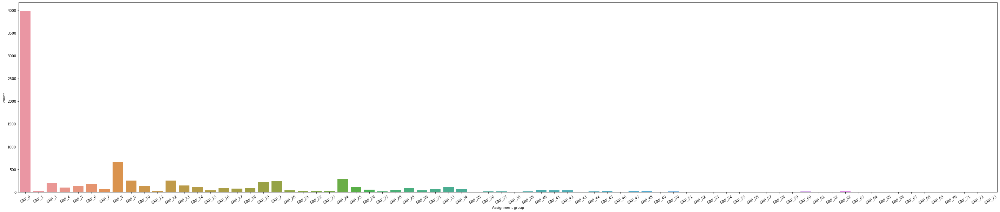

In [11]:
plt.subplots(figsize=(50,10))
ax=sns.countplot(x='Assignment group', data=data)
ax.set_xticklabels(ax.get_xticklabels(), rotation=30)
plt.tight_layout
plt.show()


In [12]:
assignment_group_count.head(50)

GRP_0     3976
GRP_8      661
GRP_24     289
GRP_12     257
GRP_9      252
GRP_2      241
GRP_19     215
GRP_3      200
GRP_6      184
GRP_13     145
GRP_10     140
GRP_5      129
GRP_14     118
GRP_25     116
GRP_33     107
GRP_4      100
GRP_29      97
GRP_18      88
GRP_16      85
GRP_17      81
GRP_31      69
GRP_7       68
GRP_34      62
GRP_26      56
GRP_40      45
GRP_28      44
GRP_41      40
GRP_30      39
GRP_15      39
GRP_42      37
GRP_20      36
GRP_45      35
GRP_22      31
GRP_1       31
GRP_11      30
GRP_21      29
GRP_47      27
GRP_48      25
GRP_23      25
GRP_62      25
GRP_60      20
GRP_39      19
GRP_27      18
GRP_37      16
GRP_36      15
GRP_44      15
GRP_50      14
GRP_53      11
GRP_65      11
GRP_52       9
Name: Assignment group, dtype: int64

In [13]:
assignment_group_count.tail(24)

GRP_55    8
GRP_51    8
GRP_59    6
GRP_49    6
GRP_46    6
GRP_43    5
GRP_32    4
GRP_66    4
GRP_68    3
GRP_56    3
GRP_38    3
GRP_58    3
GRP_63    3
GRP_71    2
GRP_57    2
GRP_69    2
GRP_54    2
GRP_72    2
GRP_61    1
GRP_73    1
GRP_70    1
GRP_35    1
GRP_67    1
GRP_64    1
Name: Assignment group, dtype: int64

### Check Missing Values in dataframe

In [14]:
data.isnull().sum()

Short description    8
Description          1
Caller               0
Assignment group     0
dtype: int64

In [15]:
data[data["Short description"].isnull()]

,Short description,Description,Caller,Assignment group
2604,NaN,\r\n\r\nreceived from: ohdrnswl.rezuibdt@gmail...,ohdrnswl rezuibdt,GRP_34
3383,NaN,\r\n-connected to the user system using teamvi...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn.\r\n-connected to...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn.\r\n-connected to...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn.\r\n-connected to...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn.\r\n-connected to...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,\r\n\r\nreceived from: eqmuniov.ehxkcbgj@gmail...,eqmuniov ehxkcbgj,GRP_0


### Copy Short Description to Description if the Description value is NaN

In [16]:
data.Description.fillna(data["Short description"], inplace = True)

In [17]:
data[data["Description"].isnull()]

,Short description,Description,Caller,Assignment group


In [18]:
data['Short description'] = data['Short description'].replace(np.nan, '', regex=True)

In [19]:
data.isnull().sum()

Short description    0
Description          0
Caller               0
Assignment group     0
dtype: int64

In [20]:
init_notebook_mode()
cf.go_offline()

# Assignment group distribution
print('\033[1mTotal assignment groups:\033[0m', data['Assignment group'].nunique())

# Histogram
data['Assignment group'].iplot(
    kind='hist',
    xTitle='Assignment Group',
    yTitle='count',
    title='Assignment Group Distribution- Histogram (Fig-1)')

# Pie chart
assgn_grp = pd.DataFrame(data.groupby('Assignment group').size(),columns = ['Count']).reset_index()
assgn_grp.iplot(
    kind='pie', 
    labels='Assignment group', 
    values='Count', 
    title='Assignment Group Distribution- Pie Chart (Fig-2)', 
    hoverinfo="label+percent+name", hole=0.25)

Total assignment groups: 74


### Lets visualize the percentage of incidents per assignment group

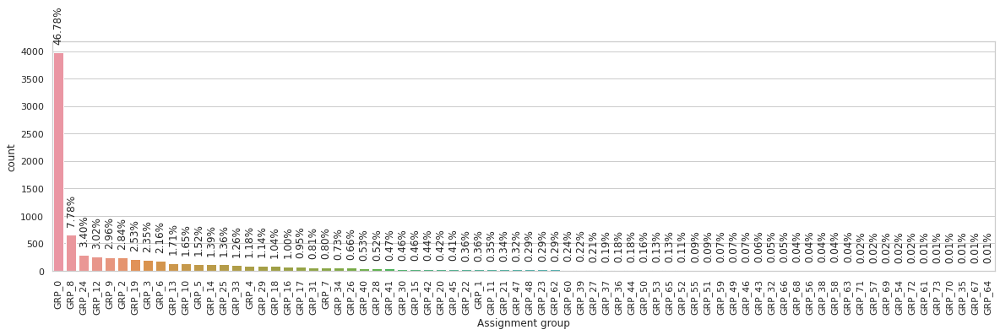

In [21]:
# Plot to visualize the percentage data distribution across different groups
sns.set(style="whitegrid")
plt.figure(figsize=(20,5))
ax = sns.countplot(x="Assignment group", data=data, order=data["Assignment group"].value_counts().index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
for p in ax.patches:
  ax.annotate(str(format(p.get_height()/len(data.index)*100, '.2f')+"%"), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'bottom', rotation=90, xytext = (0, 10), textcoords = 'offset points')

### Top 20 and Bottom 20 assignment groups

In [22]:
top_20 = data['Assignment group'].value_counts().nlargest(20).reset_index()

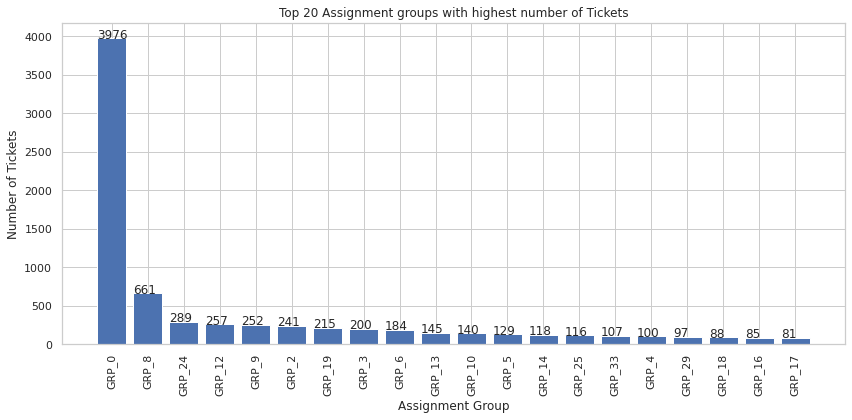

In [23]:
plt.figure(figsize=(12,6))
bars = plt.bar(top_20['index'],top_20['Assignment group'])
plt.title('Top 20 Assignment groups with highest number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

In [24]:
bottom_20 = data['Assignment group'].value_counts().nsmallest(20).reset_index()

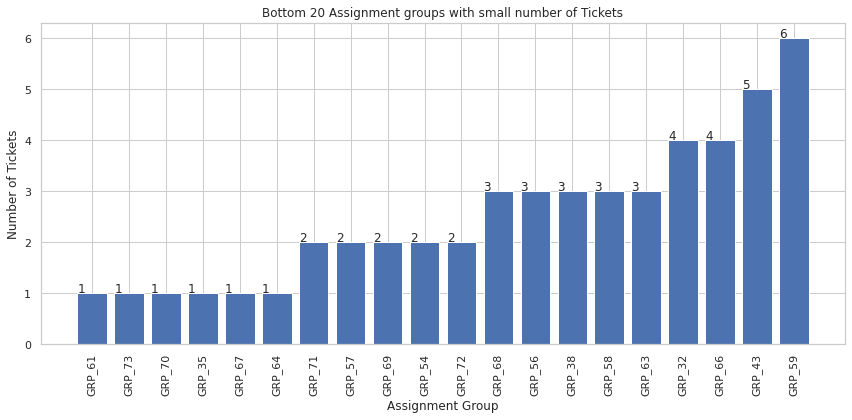

In [25]:
plt.figure(figsize=(12,6))
bars = plt.bar(bottom_20['index'],bottom_20['Assignment group'])
plt.title('Bottom 20 Assignment groups with small number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

### The distribution of Callers
Plots how the callers are associated with tickets and what are the assignment groups they most frequently raise tickets for.

In [26]:
# Find out top 10 callers in terms of frequency of raising tickets in the entire dataset
print('\033[1mTotal caller count:\033[0m', data['Caller'].nunique())
df = pd.DataFrame(data.groupby(['Caller']).size().nlargest(10), columns=['Count']).reset_index()
df.iplot(kind='pie',
         labels='Caller', 
         values='Count', 
         title='Top 10 caller- Pie Chart (Fig-7)',
         colorscale='-spectral',
         pull=[0,0,0,0,0.05,0.1,0.15,0.2,0.25,0.3])

Total caller count: 2950


### Top 5 callers in each assignment group

In [27]:
top_n = 5
s = data['Caller'].groupby(data['Assignment group']).value_counts()
caller_grp = pd.DataFrame(s.groupby(level=0).nlargest(top_n).reset_index(level=0, drop=True))
caller_grp.head(15)

Caller
Assignment group Caller                   
GRP_0            fumkcsji sarmtlhy     132
                 rbozivdq gmlhrtvp      86
                 olckhmvx pcqobjnd      54
                 efbwiadp dicafxhv      45
                 mfeyouli ndobtzpw      13
GRP_1            bpctwhsn kzqsbmtp       6
                 jloygrwh acvztedi       4
                 jyoqwxhz clhxsoqy       3
                 spxqmiry zpwgoqju       3
                 kbnfxpsy gehxzayq       2
GRP_10           bpctwhsn kzqsbmtp      60
                 ihfkwzjd erbxoyqk       6
                 dizquolf hlykecxa       5
                 gnasmtvx cwxtsvkm       3
                 hlrmufzx qcdzierm       3

### The distribution of description lengths
Plots the variation of length and word count of new description attribute

In [28]:
data.insert(1, 'desc_len', data['Description'].astype(str).apply(len))
data.insert(5, 'desc_word_count', data['Description'].apply(lambda x: len(str(x).split())))
data.head()

,Short description,desc_len,Description,Caller,Assignment group,desc_word_count
0,login issue,206,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,33
1,outlook,194,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,25
2,cant log in to vpn,87,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,11
3,unable to access hr_tool page,29,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,5
4,skype error,12,skype error,owlgqjme qhcozdfx,GRP_0,2


In [29]:
# Description text length
data['desc_len'].iplot(
    kind='bar',
    xTitle='text length',
    yTitle='count',
    colorscale='-ylgn',
    title='Description Text Length Distribution (Fig-11)')

# Description word count
data['desc_word_count'].iplot(
    kind='bar',
    xTitle='word count',
    linecolor='black',
    yTitle='count',
    colorscale='-bupu',
    title='Description Word Count Distribution (Fig-12)')

## Create a rule based engine

In [30]:
df_rules = pd.read_csv('/content/drive/MyDrive/Capstone/Rule_matrix.csv')
#df_rules = pd.read_csv("Rule_matrix.csv")

In [31]:
def applyRules(datadf,rulesdf,Description,ShortDescription):
    datadf['pred_group'] = np.nan
    for i, row in rulesdf.iterrows():                  
        for j, row in datadf.iterrows():
            if pd.notna(datadf[ShortDescription][j]):
                if (('erp' in datadf[ShortDescription][j]) and (('EU_tool' in datadf[ShortDescription][j]))):
                        datadf['pred_group'][j] = 'GRP_25'
        for j, row in datadf.iterrows():
            if pd.notna(datadf[Description][j]):
                if (datadf[Description][j] == 'the'):
                    datadf['pred_group'][j] = 'GRP_17' 
                
                if (('finance_app' in ((datadf[ShortDescription][j]) or datadf[Description][j])) and ('HostName_1132' not in datadf[ShortDescription][j])):
                    datadf['pred_group'][j] = 'GRP_55'
                
                if (('processor' in datadf[Description][j]) and ('engg' in datadf[Description][j])):
                    datadf['pred_group'][j] = 'GRP_58'
                
                                     
        if rulesdf['Short Desc Rule'][i] == 'begins with' and rulesdf['Desc Rule'][i] == 'begins with' and pd.isna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():
                if pd.notna(datadf[ShortDescription][j]) and pd.notna(datadf[Description][j]):
                    if ((datadf[ShortDescription][j].startswith(rulesdf['Short Dec Keyword'][i])) and (datadf[Description][j].startswith(rulesdf['Dec keyword'][i]))):
                        datadf['pred_group'][j] = rulesdf['Group'][i]
                        
        if pd.isna(rulesdf['Short Desc Rule'][i]) and rulesdf['Desc Rule'][i] == 'begins with' and pd.notna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():
                if pd.notna(datadf[Description][j]) and pd.notna(datadf['Caller'][j]):
                    if ((datadf[Description][j].startswith(rulesdf['Desc Rule'][i]) and (rulesdf['User'][i] == datadf['Caller'][j]))):
                        datadf['pred_group'][j] = rulesdf['Group'][i]
                        
        if rulesdf['Short Desc Rule'][i] == 'contains' and pd.notna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():
                if (pd.notna(datadf[ShortDescription][j]) and pd.notna(datadf['Caller'][j])):
                     if ((rulesdf['Short Dec Keyword'][i] in datadf[ShortDescription][j]) and (rulesdf['User'][i] == datadf['Caller'][j])):
                        datadf['pred_group'][j] = rulesdf['Group'][i]
        if rulesdf['Short Desc Rule'][i] == 'contains' and pd.isna(rulesdf['Desc Rule'][i]) and pd.isna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():
                if pd.notna(datadf[ShortDescription][j]):
                    if (rulesdf['Short Dec Keyword'][i] in datadf[ShortDescription][j]):
                        datadf['pred_group'][j] = rulesdf['Group'][i]
        if pd.isna(rulesdf['Short Desc Rule'][i]) and rulesdf['Desc Rule'][i] == 'begins with' and pd.isna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():
                if pd.notna(datadf[Description][j]):
                    if (datadf[Description][j].startswith(rulesdf['Dec keyword'][i])):
                        datadf['pred_group'][j] = rulesdf['Group'][i]
        if pd.isna(rulesdf['Short Desc Rule'][i]) and rulesdf['Desc Rule'][i] == 'contains' and pd.isna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():
                if pd.notna(datadf[Description][j]):
                    if (rulesdf['Dec keyword'][i] in datadf[Description][j]):
                        datadf['pred_group'][j] = rulesdf['Group'][i]
        if pd.isna(rulesdf['Short Desc Rule'][i]) and rulesdf['Desc Rule'][i] == 'not contain' and pd.isna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():
                if pd.notna(datadf[Description][j]):
                    if (rulesdf['Dec keyword'][i] in datadf[Description][j]):
                        datadf['pred_group'][j] = rulesdf['Group'][i]


        if rulesdf['Short Desc Rule'][i] == 'not contain' and pd.isna(rulesdf['Desc Rule'][i]) and pd.isna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():

                if pd.notna(datadf[ShortDescription][j]):
                    if (rulesdf['Short Dec Keyword'][i] in datadf[ShortDescription][j]):
                        datadf['pred_group'][j] = rulesdf['Group'][i]
        if pd.isna(rulesdf['Short Desc Rule'][i]) and rulesdf['Desc Rule'][i] == 'not contain' and pd.isna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():
                if pd.notna(datadf[Description][j]):
                    if (datadf[Description][j].startswith(rulesdf['Dec keyword'][i])):
                        datadf['pred_group'][j] = rulesdf['Group'][i]
        if pd.isna(rulesdf['Short Desc Rule'][i]) and rulesdf['Desc Rule'][i] == 'contains' and pd.isna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():
                if pd.notna(datadf[Description][j]):
                    if (rulesdf['Dec keyword'][i] in datadf[Description][j]):
                        datadf['pred_group'][j] = rulesdf['Group'][i]

    return datadf

In [32]:
rules_applied_df = applyRules(data,df_rules,'Description','Short description')
rules_applied_df

,Short description,desc_len,Description,Caller,Assignment group,desc_word_count,pred_group
0,login issue,206,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,33,NaN
1,outlook,194,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,25,NaN
2,cant log in to vpn,87,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,11,NaN
3,unable to access hr_tool page,29,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,5,NaN
4,skype error,12,skype error,owlgqjme qhcozdfx,GRP_0,2,NaN
...,...,...,...,...,...,...,...
8495,emails not coming in from zz mail,141,\r\n\r\nreceived from: avglmrts.vhqmtiua@gmail...,avglmrts vhqmtiua,GRP_29,19,NaN
8496,telephony_software issue,24,telephony_software issue,rbozivdq gmlhrtvp,GRP_0,2,NaN
8497,vip2: windows password reset for tifpdchb pedx...,50,vip2: windows password reset for tifpdchb pedx...,oybwdsgx oxyhwrfz,GRP_0,7,NaN
8498,machine nÃ£o estÃ¡ funcionando,103,i am unable to access the machine utilities to...,ufawcgob aowhxjky,GRP_62,17,NaN


In [33]:
rules_applied_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8500 non-null   object
 1   desc_len           8500 non-null   int64 
 2   Description        8500 non-null   object
 3   Caller             8500 non-null   object
 4   Assignment group   8500 non-null   object
 5   desc_word_count    8500 non-null   int64 
 6   pred_group         301 non-null    object
dtypes: int64(2), object(5)
memory usage: 465.0+ KB


In [34]:
rules_applied_df = rules_applied_df[(rules_applied_df['pred_group'].isna())]
rules_applied_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8199 entries, 0 to 8499
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8199 non-null   object
 1   desc_len           8199 non-null   int64 
 2   Description        8199 non-null   object
 3   Caller             8199 non-null   object
 4   Assignment group   8199 non-null   object
 5   desc_word_count    8199 non-null   int64 
 6   pred_group         0 non-null      object
dtypes: int64(2), object(5)
memory usage: 512.4+ KB


In [35]:
assignment_group_count=rules_applied_df['Assignment group'].value_counts()
assignment_group_count.describe()

count      62.000000
mean      132.241935
std       488.873469
min         1.000000
25%        12.250000
50%        33.000000
75%        99.250000
max      3833.000000
Name: Assignment group, dtype: float64

### Concatenate Short Description and Description Column into New Description, drop the previous columns

In [36]:
#Concatenate Short Description and Description columns
rules_applied_df['New Description'] = rules_applied_df['Description'] + ' ' +rules_applied_df['Short description']

clean_data=rules_applied_df.drop(['Short description', 'Description', 'pred_group', 'desc_len', 'desc_word_count'], axis=1)


In [37]:
clean_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8199 entries, 0 to 8499
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Caller            8199 non-null   object
 1   Assignment group  8199 non-null   object
 2   New Description   8199 non-null   object
dtypes: object(3)
memory usage: 256.2+ KB


## Fixing Garbled Text/ Mojibake using ftfy library

In [38]:
# Write a function to apply to the dataset to detect Mojibakes
def is_mojibake_impacted(text):
    if not badness.sequence_weirdness(text):
        # nothing weird, should be okay
        return True
    try:
        text.encode('sloppy-windows-1252')
    except UnicodeEncodeError:
        # Not CP-1252 encodable, probably fine
        return True
    else:
        # Encodable as CP-1252, Mojibake alert level high
        return False
# Check the dataset for mojibake impact
clean_data[~clean_data.iloc[:,:].applymap(is_mojibake_impacted).all(1)]

,Caller,Assignment group,New Description
99,ecprjbod litmjwsy,GRP_0,\n\nreceived from: ecprjbod.litmjwsy@gmail.com...
116,bgqpotek cuxakvml,GRP_0,\r\n\r\nreceived from: bgqpotek.cuxakvml@gmail...
124,tvcdfqgp nrbcqwgj,GRP_0,"from: tvcdfqgp nrbcqwgj \nsent: friday, octobe..."
164,tycludks cjofwigv,GRP_0,\n\nreceived from: abcdri@company.com\n\nwindy...
170,fbvpcytz nokypgvx,GRP_18,\n\nreceived from: fbvpcytz.nokypgvx@gmail.com...
...,...,...,...
8470,azxhejvq fyemlavd,GRP_16,"from: mikhghytr wafglhdrhjop \nsent: thursday,..."
8471,xqyjztnm onfusvlz,GRP_30,to å°è´ºï¼Œæ—©ä¸Šç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥ ç”µ...
8480,nlearzwi ukdzstwi,GRP_9,\r\n\r\nreceived from: nlearzwi.ukdzstwi@gmail...
8498,ufawcgob aowhxjky,GRP_62,i am unable to access the machine utilities to...


In [39]:
# Take an example of row# 8471 Short Desc and fix it
print('Grabled text: \033[1m%s\033[0m\nFixed text: \033[1m%s\033[0m' % (clean_data['New Description'][8471], 
                                                                        fix_text(clean_data['New Description'][8471])))

# List all mojibakes defined in ftfy library
print('\nMojibake Symbol RegEx:\n', badness.MOJIBAKE_SYMBOL_RE.pattern)

Grabled text: to å°è´ºï¼Œæ—©ä¸Šç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥ ç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥
Fixed text: to 小贺,早上电脑开机开不出来 电脑开机开不出来

Mojibake Symbol RegEx:
 [ÂÃÎÏÐÑØÙĂĎĐŃŘŮ][-€ƒ‚„†‡ˆ‰‹Œ“•˜œŸ¡¢£¤¥¦§¨ª«¬¯°±²³µ¶·¸¹º¼½¾¿ˇ˘˝]|[ÂÃÎÏÐÑØÙĂĎĐŃŘŮ][›»‘”´©™]\w|×[-ƒ‚„†‡ˆ‰‹Œ“•˜œŸ¡¦§¨ª«¬¯°²³ˇ˘›‘”´©™]|[¬√][ÄÅÇÉÑÖÜáàâäãåçéèêëíìîïñúùûü†¢£§¶ß®©™≠ÆØ¥ªæø≤≥]|\w√[±∂]\w|◊|[ðđ][Ÿ]|â€|вЂ[љћ¦°№™ќ“”]


In [40]:
# Sanitize the dataset from Mojibakes
clean_data['New Description'] = clean_data['New Description'].apply(fix_text)

# Visualize that row# 8471
clean_data.loc[8471]

Caller                      xqyjztnm onfusvlz
Assignment group                       GRP_30
New Description     to 小贺,早上电脑开机开不出来 电脑开机开不出来
Name: 8471, dtype: object

## Cleaning & Processing the data

In [41]:
def date_validity(date_str):
    try:
        parser.parse(date_str)
        return True
    except:
        return False

In [42]:

def process(text_string):
    text=text_string.lower()
    text_string = ' '.join([w for w in text_string.split() if not date_validity(w)])
    text_string = re.sub(r"received from:",'',text_string)
    text_string = re.sub(r"from:",' ',text_string)
    text_string = re.sub(r"to:",' ',text_string)
    text_string = re.sub(r"subject:",' ',text_string)
    text_string = re.sub(r"sent:",' ',text_string)
    text_string = re.sub(r"ic:",' ',text_string)
    text_string = re.sub(r"cc:",' ',text_string)
    text_string = re.sub(r"bcc:",' ',text_string)
    text_string = re.sub(r'\S*@\S*\s?', '', text_string)
    text_string = re.sub(r'\d+','' ,text_string)
    text_string = re.sub(r'\n',' ',text_string)
    text_string = re.sub(r'#','', text_string)
    text_string = re.sub(r'&;?', 'and',text_string)
    text_string = re.sub(r'\&\w*;', '', text_string)
    text_string = re.sub(r'https?:\/\/.*\/\w*', '', text_string)  
    #text_string= ''.join(c for c in text_string if c <= '\uFFFF') 
    text_string = text_string.strip()
    #text_string = ' '.join(re.sub("[^\u0030-\u0039\u0041-\u005a\u0061-\u007a]", " ", text_string).split())
    text_string = re.sub(r"\s+[a-zA-Z]\s+", ' ', text_string)
    text_string = re.sub(' +', ' ', text_string)
    text_string = text_string.replace(r'\b\w\b','').replace(r'\s+', ' ')
    text_string = text_string.strip()
    return text_string


In [43]:
clean_data["Clean_Description"] = clean_data["New Description"].apply(process)

In [44]:
clean_data

,Caller,Assignment group,New Description,Clean_Description
0,spxjnwir pjlcoqds,GRP_0,-verified user details.(employee# & manager na...,-verified user details.(employee and manager n...
1,hmjdrvpb komuaywn,GRP_0,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,"hello team, my meetings/skype meetings etc are..."
2,eylqgodm ybqkwiam,GRP_0,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,hi cannot log on to vpn best cant log in to vpn
3,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...,unable to access hr_tool page unable to access...
4,owlgqjme qhcozdfx,GRP_0,skype error skype error,skype error skype error
...,...,...,...,...
8495,avglmrts vhqmtiua,GRP_29,\n\nreceived from: avglmrts.vhqmtiua@gmail.com...,"good afternoon, am not receiving the emails th..."
8496,rbozivdq gmlhrtvp,GRP_0,telephony_software issue telephony_software issue,telephony_software issue telephony_software issue
8497,oybwdsgx oxyhwrfz,GRP_0,vip2: windows password reset for tifpdchb pedx...,vip: windows password reset for tifpdchb pedxr...
8498,ufawcgob aowhxjky,GRP_62,i am unable to access the machine utilities to...,i am unable to access the machine utilities to...


## Language Translation

#### Load the consolidated final translated pickle file which contains the language translations. The Process used for language translation is commented below

In [45]:
with open('/content/drive/MyDrive/Capstone/Final_Translated_combined.pkl','rb') as f:
    clean_data = pickle.load(f)

In [46]:
clean_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8466 entries, 0 to 48
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Caller             8466 non-null   object
 1   Assignment group   8466 non-null   object
 2   New Description    8466 non-null   object
 3   Clean_Description  8466 non-null   object
 4   language           8466 non-null   object
 5   Translated Text    8466 non-null   object
dtypes: object(6)
memory usage: 463.0+ KB


In [47]:
#!pip install langdetect

In [48]:
'''from langdetect import detect
    
def fn_lang_detect(df):                                        
   try:                                                          
      return detect(df)                                      
   except:                                                       
      return 'no'                                                  

clean_data['language'] = clean_data['Clean_Description'].apply(fn_lang_detect)'''

"from langdetect import detect\n    \ndef fn_lang_detect(df):                                        \n   try:                                                          \n      return detect(df)                                      \n   except:                                                       \n      return 'no'                                                  \n\nclean_data['language'] = clean_data['Clean_Description'].apply(fn_lang_detect)"

In [49]:
'''x = clean_data["language"].value_counts()
x=x.sort_index()
plt.figure(figsize=(10,6))
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Distribution of text by language")
plt.ylabel('number of records')
plt.xlabel('Language')
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')
plt.show();'''

'x = clean_data["language"].value_counts()\nx=x.sort_index()\nplt.figure(figsize=(10,6))\nax= sns.barplot(x.index, x.values, alpha=0.8)\nplt.title("Distribution of text by language")\nplt.ylabel(\'number of records\')\nplt.xlabel(\'Language\')\nrects = ax.patches\nlabels = x.values\nfor rect, label in zip(rects, labels):\n    height = rect.get_height()\n    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha=\'center\', va=\'bottom\')\nplt.show();'

In [50]:
#clean_data = clean_data[(clean_data["language"]!='zh-cn')]

In [51]:
#!pip install goslate

In [52]:
'''import goslate
gs = goslate.Goslate()
def translate(text_string):
  translation = gs.translate(text_string, 'en')
  return translation'''

"import goslate\ngs = goslate.Goslate()\ndef translate(text_string):\n  translation = gs.translate(text_string, 'en')\n  return translation"

We can see that most of the tickets are in english, followed by tickets in German language. We need to translate these into english.

In [53]:
#german_data = pd.read_csv("/content/drive/MyDrive/Capstone/german.csv")
#german_data = pd.read_csv('german.csv')

In [54]:
#german_data

In [55]:
#german_dictionary = german_data.to_dict(orient='records')


In [56]:
'''
def translate_function(text):
    translated_text = []
    text_split = text.split()
    for text in text_split:
        word_found = False
        for item in range(len(german_dictionary)):
            if text == german_dictionary[item]["German"]:
                translated_text.append(german_dictionary[item]["English"])
                word_found = True
        if word_found == False:
            translated_text.append(text)
    translate = ' '.join([word for word in translated_text])        
    return translate

clean_data["Translated Text"] = clean_data["Clean_Description"].apply(translate_function)'''

'\ndef translate_function(text):\n    translated_text = []\n    text_split = text.split()\n    for text in text_split:\n        word_found = False\n        for item in range(len(german_dictionary)):\n            if text == german_dictionary[item]["German"]:\n                translated_text.append(german_dictionary[item]["English"])\n                word_found = True\n        if word_found == False:\n            translated_text.append(text)\n    translate = \' \'.join([word for word in translated_text])        \n    return translate\n\nclean_data["Translated Text"] = clean_data["Clean_Description"].apply(translate_function)'

In [57]:
#clean_data.tail(10)

In [58]:
#clean_data[clean_data.language == 'de']

In [59]:
'''# Load the translated pickle file 
with open('/content/drive/MyDrive/Capstone/clean_data_translated.pkl','rb') as f:
    clean_data_translated_pkl = pickle.load(f)'''

"# Load the translated pickle file \nwith open('/content/drive/MyDrive/Capstone/clean_data_translated.pkl','rb') as f:\n    clean_data_translated_pkl = pickle.load(f)"

In [60]:
#clean_data_translated_pkl.rename(columns = {'Translation_Text':'Translated Text'}, inplace = True) 

In [61]:
'''dataframes=[clean_data,clean_data_translated_pkl]
clean_data_final_2= pd.concat(dataframes)'''

'dataframes=[clean_data,clean_data_translated_pkl]\nclean_data_final_2= pd.concat(dataframes)'

In [62]:
'''clean_data_final_2.to_csv('clean_data_final_2.csv', index=False, encoding='utf_8_sig')
with open('/content/drive/MyDrive/Capstone/Final_Translated_combined.pkl','wb') as f:
    pickle.dump(clean_data_final_2, f, pickle.HIGHEST_PROTOCOL)'''

"clean_data_final_2.to_csv('clean_data_final_2.csv', index=False, encoding='utf_8_sig')\nwith open('/content/drive/MyDrive/Capstone/Final_Translated_combined.pkl','wb') as f:\n    pickle.dump(clean_data_final_2, f, pickle.HIGHEST_PROTOCOL)"

In [63]:
'''# Load the consolidated final translated pickle file 
with open('/content/drive/MyDrive/Capstone/Final_Translated_combined.pkl','rb') as f:
    clean_data = pickle.load(f)'''

"# Load the consolidated final translated pickle file \nwith open('/content/drive/MyDrive/Capstone/Final_Translated_combined.pkl','rb') as f:\n    clean_data = pickle.load(f)"

In [64]:
#clean_data.info()

In [65]:
#clean_data = clean_data[clean_data['Assignment group'].map(clean_data['Assignment group'].value_counts()) > 15]

In [66]:
'''clean_data.to_csv('clean_data.csv', index=False, encoding='utf_8_sig')
with open('/content/drive/MyDrive/Capstone/Final_Translated_combined.pkl','wb') as f:
    pickle.dump(clean_data, f, pickle.HIGHEST_PROTOCOL)'''

"clean_data.to_csv('clean_data.csv', index=False, encoding='utf_8_sig')\nwith open('/content/drive/MyDrive/Capstone/Final_Translated_combined.pkl','wb') as f:\n    pickle.dump(clean_data, f, pickle.HIGHEST_PROTOCOL)"

## Data Augmentation

In [67]:
!pip3 install nltk
import nltk 
nltk.download('wordnet')
nltk.download('punkt')
from nltk.corpus import wordnet

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [68]:
from collections import OrderedDict
from nltk.tokenize import word_tokenize
def find_synonyms(word):
  synonyms = []
  for synset in wordnet.synsets(word):
    for syn in synset.lemma_names():
      synonyms.append(syn)

  # using this to drop duplicates while maintaining word order (closest synonyms comes first)
  synonyms_without_duplicates = list(OrderedDict.fromkeys(synonyms))
  return synonyms_without_duplicates

In [69]:
def create_set_of_new_sentences(sentence, max_syn_per_word = 3):
  count = 0
  new_sentences = []
  for word in word_tokenize(sentence):
    if len(word)<=3 : continue 
    for synonym in find_synonyms(word)[0:max_syn_per_word]:
      synonym = synonym.replace('_', ' ') #restore space character
      new_sentence = sentence.replace(word,synonym)
      if count <= 4:
        new_sentences.append(new_sentence)
        count += 1    
  return new_sentences

In [70]:
med_records=['GRP_8','GRP_3','GRP_12','GRP_2','GRP_13','GRP_19']

low_records=['GRP_24','GRP_9','GRP_6','GRP_10','GRP_5','GRP_14','GRP_25','GRP_33','GRP_4','GRP_29','GRP_18','GRP_16','GRP_17','GRP_31','GRP_7','GRP_34','GRP_26','GRP_40','GRP_28','GRP_41'
,'GRP_15','GRP_30','GRP_42','GRP_20','GRP_45','GRP_22','GRP_1','GRP_11']

vlow_records =['GRP_21','GRP_47','GRP_23','GRP_62','GRP_48','GRP_60','GRP_39','GRP_27','GRP_37','GRP_44','GRP_36','GRP_50','GRP_53','GRP_65','GRP_53','GRP_52','GRP_55','GRP_51','GRP_59','GRP_49','GRP_46','GRP_43','GRP_66','GRP_32','GRP_63','GRP_58','GRP_56','GRP_38','GRP_68','GRP_69','GRP_57','GRP_72','GRP_71','GRP_54','GRP_35','GRP_64','GRP_70','GRP_61','GRP_67','GRP_73']

clean_data1 = clean_data[clean_data["Assignment group"].isin(med_records)]
clean_data2 = clean_data[clean_data["Assignment group"].isin(low_records)]
clean_data3 = clean_data[clean_data["Assignment group"] .isin(vlow_records)]

clean_data4 = clean_data[clean_data["Assignment group"] == 'GRP_0']
clean_data4['Final_Text'] = clean_data4['Translated Text']
clean_data4 = clean_data4.drop(['New Description','Clean_Description','Translated Text'],axis=1)

Do after this.... 

In [71]:
clean_data1

,Caller,Assignment group,New Description,Clean_Description,language,Translated Text
17,sigfdwcj reofwzlm,GRP_3,"when undocking pc , screen will not come back ...","when undocking pc , screen will not come back ...",en,"When undocking pc , screen want distress come ..."
50,bpctwhsn kzqsbmtp,GRP_8,received from: monitoring_tool@company.com\n\n...,job mm_zscr_dly_merktc failed in job_scheduler...,en,job mm_zscr_dly_merktc failed in job_scheduler...
59,bpctwhsn kzqsbmtp,GRP_8,received from: monitoring_tool@company.com\n\n...,job mm_zscr_dly_merktc failed in job_scheduler...,en,job mm_zscr_dly_merktc failed in job_scheduler...
60,bpctwhsn kzqsbmtp,GRP_8,received from: monitoring_tool@company.com\n\n...,job Job_ failed in job_scheduler at: job Job_ ...,en,job Job_ failed in job_scheduler at: job Job_ ...
64,utyeofsk rdyzpwhi,GRP_8,apac company : two switches are down since 3.4...,apac company : two switches are down since am ...,en,apac company : two switches are down since at ...
...,...,...,...,...,...,...
34,djilqgmw bidchqsg,GRP_12,kein zugriff von abteilung ce abstech eemw8144...,kein zugriff von abteilung ce abstech eemw auf...,de,No access from department CE score Eemw on dat...
86,ZkBogxib QsEJzdZO,GRP_8,received from: monitoring_tool@company.com\n\n...,abended job in job scheduler Job at abended jo...,de,Evening Job in Job Scheduler Job at Evened Job...
88,ZkBogxib QsEJzdZO,GRP_8,received from: monitoring_tool@company.com\n\n...,abended job in job scheduler SID hotf at abend...,de,Evening Job in Job Scheduler Sid Hotf at Evene...
89,trgqbeax hfyzudql,GRP_12,\n\nreceived from: trgqbeax.hfyzudql@gmail.com...,please restore from westes HostName file HostN...,de,Please restore from Westes Hostname File Hostn...


In [72]:
clean_data2

,Caller,Assignment group,New Description,Clean_Description,language,Translated Text
6,jyoqwxhz clhxsoqy,GRP_1,event: critical:HostName_221.company.com the v...,event: critical:HostName_.company.com the valu...,en,event: critical:HostName_.company.com the valu...
32,kxsceyzo naokumlb,GRP_4,\n\nreceived from: kxsceyzo.naokumlb@gmail.com...,"gentles, have two devices that are trying to s...",en,"gentles, have two devices did are trying to sh..."
43,yisohglr uvteflgb,GRP_5,\n\nreceived from: yisohglr.uvteflgb@gmail.com...,hi - the printer printer is not working and ne...,en,Hi - the printer printer is distress working a...
47,bpctwhsn kzqsbmtp,GRP_6,received from: monitoring_tool@company.com\n\n...,job Job_ failed in job_scheduler at: job Job_ ...,en,job Job_ failed in job_scheduler at: job Job_ ...
49,aofnvyzt eqiyskhm,GRP_7,"when closing a call, the agent keeps on the ""o...","when closing call, the agent keeps on the ""on ...",en,"When closing call, the agent keeps on the ""on ..."
...,...,...,...,...,...,...
43,omatlyrd bvraipdt,GRP_30,文件无法通过打印机fe08打印 文件无法通过打印机fe08打印,文件无法通过打印机fe打印 文件无法通过打印机fe打印,zh-cn,The file cannot be printed by the printer FE p...
44,wgmqlnzh vpebwoat,GRP_30,早上开机后显示器不出图像。 显示器不亮,早上开机后显示器不出图像。 显示器不亮,zh-cn,The display does not appear in the morning. Di...
45,rtjwbuev gfpwdetq,GRP_31,"prtSID_737--文件无法打印到打印机,提示打印机错误。 文件无法打印到打印机,提示打...","prtSID_--文件无法打印到打印机,提示打印机错误。 文件无法打印到打印机,提示打印机错误。",zh-cn,The prtsid _- file cannot be printed to the pr...
47,kyagjxdh dmtjpbnz,GRP_30,"进行采购时显示""找不到员工1111154833的数据,请通知系统管理员"" erp无法进行采购...","进行采购时显示""找不到员工的数据,请通知系统管理员"" erp无法进行采购(转给贺正平)",zh-cn,"Show ""Data from the employee, please notify th..."


In [73]:
clean_data3

,Caller,Assignment group,New Description,Clean_Description,language,Translated Text
197,uyrpdvoq mbzevtcx,GRP_21,i need to approve the new product requests bel...,i need to approve the new product requests bel...,en,i need to approve the new product requests bel...
206,ajgnibkx zixmcjgu,GRP_23,unable to see the current course in ethics\n\n...,unable to see the current course in ethics use...,en,unable to lake the current course in ethics us...
247,tphbruoq xtukhnym,GRP_27,"ic: welcome, our next available agent will be ...","welcome, our next available agent will be with...",en,"welcome, our next available agent want be with..."
250,obanjrhg rnafleys,GRP_27,name:obanjrhg rnafleys\nlanguage:\nbrowser:mic...,name:obanjrhg rnafleys language: browser:micro...,en,name:obanjrhg rnafleys language: browser:micro...
298,stdezpqw bkmeuhfz,GRP_21,internal users are unable to download discount...,internal users are unable to download discount...,en,internal users are unable to download discount...
...,...,...,...,...,...,...
36,neovalui kabpfvic,GRP_48,"网络不通,右下角网络图标显示未连接到网络。 网络不通","网络不通,右下角网络图标显示未连接到网络。 网络不通",zh-cn,"The network is not connected, the lower right ..."
39,agyvbnwz mxsonkdc,GRP_48,"制粉三楼控制室内电脑电源线、网线等因高温损坏,需更换。 制粉电脑电源线等损坏","制粉三楼控制室内电脑电源线、网线等因高温损坏,需更换。 制粉电脑电源线等损坏",zh-cn,The third floor of the powder is controlled by...
40,jtplaoui uvsihfpn,GRP_48,"编辑ppt时,总是弹出""无法检查拼写和语法错误"",也无法安装。 拼写和语法错误","编辑ppt时,总是弹出""无法检查拼写和语法错误"",也无法安装。 拼写和语法错误",zh-cn,"When editing PPT, you always pop up ""Unable to..."
41,kwpzbxvf cvuhoizx,GRP_48,"质控部拉力试验机控制电脑的操作系统启动非常缓慢,控制软件丢失。 电脑故障","质控部拉力试验机控制电脑的操作系统启动非常缓慢,控制软件丢失。 电脑故障",zh-cn,Quality-controlled tensile testing machine con...


In [74]:
clean_data4

,Caller,Assignment group,language,Final_Text
0,spxjnwir pjlcoqds,GRP_0,en,-verified user details.(employee and Manager n...
1,hmjdrvpb komuaywn,GRP_0,en,"hello team, my meetings/skype meetings etc are..."
2,eylqgodm ybqkwiam,GRP_0,en,Hi cannot log on to vpn best cant log in to vpn
3,xbkucsvz gcpydteq,GRP_0,en,unable to access hr_tool page unable to access...
4,owlgqjme qhcozdfx,GRP_0,no,skype error skype error
...,...,...,...,...
87,gasbfqvp fmvqgjih,GRP_0,de,"On my part, the password was incorrectly enter..."
97,nizholae bjnqikym,GRP_0,de,Stephryhan Needs Access to Below Collaboration...
100,bmhrsxlf ukatbwyi,GRP_0,de,benefits issue benefits issue
101,sjxhcyrq iupxtjcf,GRP_0,de,Security Error in travel expenses Billing Prog...


In [75]:
maxsyn=1
#clean_data1["Augmented_data"] = clean_data1["Translated Text"].apply(create_set_of_new_sentences)
clean_data1["Augmented_data"] = clean_data1.apply(lambda x: create_set_of_new_sentences(x['Translated Text'], maxsyn),axis=1)

clean_data1

,Caller,Assignment group,New Description,Clean_Description,language,Translated Text,Augmented_data
17,sigfdwcj reofwzlm,GRP_3,"when undocking pc , screen will not come back ...","when undocking pc , screen will not come back ...",en,"When undocking pc , screen want distress come ...","[When undock pc , screen want distress come ba..."
50,bpctwhsn kzqsbmtp,GRP_8,received from: monitoring_tool@company.com\n\n...,job mm_zscr_dly_merktc failed in job_scheduler...,en,job mm_zscr_dly_merktc failed in job_scheduler...,[job mm_zscr_dly_merktc fail in job_scheduler ...
59,bpctwhsn kzqsbmtp,GRP_8,received from: monitoring_tool@company.com\n\n...,job mm_zscr_dly_merktc failed in job_scheduler...,en,job mm_zscr_dly_merktc failed in job_scheduler...,[job mm_zscr_dly_merktc fail in job_scheduler ...
60,bpctwhsn kzqsbmtp,GRP_8,received from: monitoring_tool@company.com\n\n...,job Job_ failed in job_scheduler at: job Job_ ...,en,job Job_ failed in job_scheduler at: job Job_ ...,[job Job_ fail in job_scheduler at: job Job_ f...
64,utyeofsk rdyzpwhi,GRP_8,apac company : two switches are down since 3.4...,apac company : two switches are down since am ...,en,apac company : two switches are down since at ...,[apac company : two switches are down since at...
...,...,...,...,...,...,...,...
34,djilqgmw bidchqsg,GRP_12,kein zugriff von abteilung ce abstech eemw8144...,kein zugriff von abteilung ce abstech eemw auf...,de,No access from department CE score Eemw on dat...,[No entree from department CE score Eemw on da...
86,ZkBogxib QsEJzdZO,GRP_8,received from: monitoring_tool@company.com\n\n...,abended job in job scheduler Job at abended jo...,de,Evening Job in Job Scheduler Job at Evened Job...,[evening Job in Job Scheduler Job at Evened Jo...
88,ZkBogxib QsEJzdZO,GRP_8,received from: monitoring_tool@company.com\n\n...,abended job in job scheduler SID hotf at abend...,de,Evening Job in Job Scheduler Sid Hotf at Evene...,[evening Job in Job Scheduler Sid Hotf at Even...
89,trgqbeax hfyzudql,GRP_12,\n\nreceived from: trgqbeax.hfyzudql@gmail.com...,please restore from westes HostName file HostN...,de,Please restore from Westes Hostname File Hostn...,[please restore from Westes Hostname File Host...


In [76]:
s = clean_data1.apply(lambda x: pd.Series(x['Augmented_data']), axis=1).stack().reset_index(level=1, drop=True)
s.name = 'Final_Text'
clean_data_aug1 = clean_data1.drop(['New Description','Augmented_data', 'Clean_Description', 'Translated Text'],axis=1).join(s)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



In [77]:
# Assignment group distribution
print('\033[1mTotal assignment groups:\033[0m', clean_data_aug1['Assignment group'].nunique())

# Histogram
clean_data_aug1['Assignment group'].iplot(
    kind='hist',
    xTitle='Assignment Group',
    yTitle='count',
    title='Assignment Group Distribution- Histogram (Fig-1)')

Total assignment groups: 6


In [78]:
maxsyn=6
clean_data2["Augmented_data"] = clean_data2.apply(lambda x: create_set_of_new_sentences(x['Translated Text'], maxsyn),axis=1)

clean_data2

,Caller,Assignment group,New Description,Clean_Description,language,Translated Text,Augmented_data
6,jyoqwxhz clhxsoqy,GRP_1,event: critical:HostName_221.company.com the v...,event: critical:HostName_.company.com the valu...,en,event: critical:HostName_.company.com the valu...,[event: critical:HostName_.company.com the val...
32,kxsceyzo naokumlb,GRP_4,\n\nreceived from: kxsceyzo.naokumlb@gmail.com...,"gentles, have two devices that are trying to s...",en,"gentles, have two devices did are trying to sh...","[pacify, have two devices did are trying to sh..."
43,yisohglr uvteflgb,GRP_5,\n\nreceived from: yisohglr.uvteflgb@gmail.com...,hi - the printer printer is not working and ne...,en,Hi - the printer printer is distress working a...,[Hi - the printer printer is distress working ...
47,bpctwhsn kzqsbmtp,GRP_6,received from: monitoring_tool@company.com\n\n...,job Job_ failed in job_scheduler at: job Job_ ...,en,job Job_ failed in job_scheduler at: job Job_ ...,[job Job_ fail in job_scheduler at: job Job_ f...
49,aofnvyzt eqiyskhm,GRP_7,"when closing a call, the agent keeps on the ""o...","when closing call, the agent keeps on the ""on ...",en,"When closing call, the agent keeps on the ""on ...","[When shutting call, the agent keeps on the ""o..."
...,...,...,...,...,...,...,...
43,omatlyrd bvraipdt,GRP_30,文件无法通过打印机fe08打印 文件无法通过打印机fe08打印,文件无法通过打印机fe打印 文件无法通过打印机fe打印,zh-cn,The file cannot be printed by the printer FE p...,[The file cannot be printed by the printer FE ...
44,wgmqlnzh vpebwoat,GRP_30,早上开机后显示器不出图像。 显示器不亮,早上开机后显示器不出图像。 显示器不亮,zh-cn,The display does not appear in the morning. Di...,[The display does not appear in the morning. D...
45,rtjwbuev gfpwdetq,GRP_31,"prtSID_737--文件无法打印到打印机,提示打印机错误。 文件无法打印到打印机,提示打...","prtSID_--文件无法打印到打印机,提示打印机错误。 文件无法打印到打印机,提示打印机错误。",zh-cn,The prtsid _- file cannot be printed to the pr...,[The prtsid _- file cannot be printed to the p...
47,kyagjxdh dmtjpbnz,GRP_30,"进行采购时显示""找不到员工1111154833的数据,请通知系统管理员"" erp无法进行采购...","进行采购时显示""找不到员工的数据,请通知系统管理员"" erp无法进行采购(转给贺正平)",zh-cn,"Show ""Data from the employee, please notify th...","[show ""Data from the employee, please notify t..."


In [79]:
s = clean_data2.apply(lambda x: pd.Series(x['Augmented_data']), axis=1).stack().reset_index(level=1, drop=True)
s.name = 'Final_Text'
clean_data_aug2 = clean_data2.drop(['New Description','Augmented_data', 'Clean_Description', 'Translated Text'],axis=1).join(s)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



In [80]:
# Assignment group distribution
print('\033[1mTotal assignment groups:\033[0m', clean_data_aug2['Assignment group'].nunique())

# Histogram
clean_data_aug2['Assignment group'].iplot(
    kind='hist',
    xTitle='Assignment Group',
    yTitle='count',
    title='Assignment Group Distribution- Histogram (Fig-2)')

Total assignment groups: 28


In [81]:
maxsyn=10
clean_data3["Augmented_data"] = clean_data3.apply(lambda x: create_set_of_new_sentences(x['Translated Text'], maxsyn),axis=1)

clean_data3

,Caller,Assignment group,New Description,Clean_Description,language,Translated Text,Augmented_data
197,uyrpdvoq mbzevtcx,GRP_21,i need to approve the new product requests bel...,i need to approve the new product requests bel...,en,i need to approve the new product requests bel...,[i need to approve the new product requests be...
206,ajgnibkx zixmcjgu,GRP_23,unable to see the current course in ethics\n\n...,unable to see the current course in ethics use...,en,unable to lake the current course in ethics us...,[unable to lake the current course in ethics u...
247,tphbruoq xtukhnym,GRP_27,"ic: welcome, our next available agent will be ...","welcome, our next available agent will be with...",en,"welcome, our next available agent want be with...","[welcome, our next available agent want be wit..."
250,obanjrhg rnafleys,GRP_27,name:obanjrhg rnafleys\nlanguage:\nbrowser:mic...,name:obanjrhg rnafleys language: browser:micro...,en,name:obanjrhg rnafleys language: browser:micro...,[name:obanjrhg rnafleys language: browser:micr...
298,stdezpqw bkmeuhfz,GRP_21,internal users are unable to download discount...,internal users are unable to download discount...,en,internal users are unable to download discount...,[internal users are unable to download discoun...
...,...,...,...,...,...,...,...
36,neovalui kabpfvic,GRP_48,"网络不通,右下角网络图标显示未连接到网络。 网络不通","网络不通,右下角网络图标显示未连接到网络。 网络不通",zh-cn,"The network is not connected, the lower right ...","[The network is not connected, the lower right..."
39,agyvbnwz mxsonkdc,GRP_48,"制粉三楼控制室内电脑电源线、网线等因高温损坏,需更换。 制粉电脑电源线等损坏","制粉三楼控制室内电脑电源线、网线等因高温损坏,需更换。 制粉电脑电源线等损坏",zh-cn,The third floor of the powder is controlled by...,[The one-third floor of the powder is controll...
40,jtplaoui uvsihfpn,GRP_48,"编辑ppt时,总是弹出""无法检查拼写和语法错误"",也无法安装。 拼写和语法错误","编辑ppt时,总是弹出""无法检查拼写和语法错误"",也无法安装。 拼写和语法错误",zh-cn,"When editing PPT, you always pop up ""Unable to...","[When editing PPT, you always pop up ""Unable t..."
41,kwpzbxvf cvuhoizx,GRP_48,"质控部拉力试验机控制电脑的操作系统启动非常缓慢,控制软件丢失。 电脑故障","质控部拉力试验机控制电脑的操作系统启动非常缓慢,控制软件丢失。 电脑故障",zh-cn,Quality-controlled tensile testing machine con...,[Quality-controlled tensile testing machine co...


In [82]:
s = clean_data3.apply(lambda x: pd.Series(x['Augmented_data']), axis=1).stack().reset_index(level=1, drop=True)
s.name = 'Final_Text'
clean_data_aug3 = clean_data3.drop(['New Description','Augmented_data', 'Clean_Description', 'Translated Text'],axis=1).join(s)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



In [83]:
# Assignment group distribution
print('\033[1mTotal assignment groups:\033[0m', clean_data_aug3['Assignment group'].nunique())

# Histogram
clean_data_aug3['Assignment group'].iplot(
    kind='hist',
    xTitle='Assignment Group',
    yTitle='count',
    title='Assignment Group Distribution- Histogram (Fig-4)')

Total assignment groups: 8


In [84]:
'''maxsyn=1
clean_data4["Augmented_data"] = clean_data4.apply(lambda x: create_set_of_new_sentences(x['Translated Text'], maxsyn),axis=1)

clean_data4'''

'maxsyn=1\nclean_data4["Augmented_data"] = clean_data4.apply(lambda x: create_set_of_new_sentences(x[\'Translated Text\'], maxsyn),axis=1)\n\nclean_data4'

In [85]:
'''s = clean_data4.apply(lambda x: pd.Series(x['Augmented_data']), axis=1).stack().reset_index(level=1, drop=True)
s.name = 'Final_Text'
clean_data_aug4 = clean_data4.drop(['New Description','Augmented_data', 'Clean_Description', 'Translated Text'],axis=1).join(s)'''

"s = clean_data4.apply(lambda x: pd.Series(x['Augmented_data']), axis=1).stack().reset_index(level=1, drop=True)\ns.name = 'Final_Text'\nclean_data_aug4 = clean_data4.drop(['New Description','Augmented_data', 'Clean_Description', 'Translated Text'],axis=1).join(s)"

In [86]:
'''# Assignment group distribution
print('\033[1mTotal assignment groups:\033[0m', clean_data_aug4['Assignment group'].nunique())

# Histogram
clean_data_aug4['Assignment group'].iplot(
    kind='hist',
    xTitle='Assignment Group',
    yTitle='count',
    title='Assignment Group Distribution- Histogram (Fig-5)')'''

"# Assignment group distribution\nprint('\x1bTotal assignment groups:\x1b', clean_data_aug4['Assignment group'].nunique())\n\n# Histogram\nclean_data_aug4['Assignment group'].iplot(\n    kind='hist',\n    xTitle='Assignment Group',\n    yTitle='count',\n    title='Assignment Group Distribution- Histogram (Fig-5)')"

clean_data_mod4 = clean_data4.drop(['New Description', 'Clean_Description'],axis=1)
clean_data_mod4.rename(columns={'Translated Text': 'Final_Text'}, inplace=True)
clean_data_mod4.head()

In [87]:
dataframes=[clean_data_aug1,clean_data_aug2,clean_data_aug3,clean_data4]
#dataframes=[clean_data_aug1,clean_data_aug2,clean_data_aug3]
clean_data_result= pd.concat(dataframes)

In [88]:
# Assignment group distribution
print('\033[1mTotal assignment groups:\033[0m', clean_data_result['Assignment group'].nunique())

# Histogram
clean_data_result['Assignment group'].iplot(
    kind='hist',
    xTitle='Assignment Group',
    yTitle='count',
    title='Assignment Group Distribution- Histogram (Fig-5)')

Total assignment groups: 43


In [89]:
clean_data_result.shape, clean_data_aug1.shape, clean_data_aug2.shape, clean_data_aug3.shape, clean_data4.shape

((28208, 4), (7099, 4), (16305, 4), (863, 4), (3941, 4))

In [90]:
# Serialize the Augmented dataset for later use
clean_data_result.to_csv('Interim_data.csv', index=False, encoding='utf_8_sig')
with open('/content/Interim_data.pkl','wb') as f:
    pickle.dump(clean_data_result, f, pickle.HIGHEST_PROTOCOL)

## Stop words removal and Lemmatise text

In [91]:
#Stop words removal
nltk.download('stopwords')
from nltk.corpus import stopwords

sr = stopwords.words('english')
for i,text in enumerate(clean_data_result['Final_Text']):
  try:
    clean_data_result['Final_Text'][i]=" ".join(word for word in text.split(' ') if word not in sr)
  except:
    pass

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [92]:
clean_data_result

,Caller,Assignment group,language,Final_Text
1,tqrylspg ijzghqwy,GRP_12,de,Message mistake re-connections Hostname No acc...
1,tqrylspg ijzghqwy,GRP_12,de,Message mistake re-connections Hostname No acc...
1,tqrylspg ijzghqwy,GRP_12,de,Message mistake re-connections Hostname No acc...
1,tqrylspg ijzghqwy,GRP_12,de,Message mistake re-connections Hostname No acc...
8,uhiekyjz mflihxpq,GRP_12,de,I access internal difficult drive PC access b ...
...,...,...,...,...
87,gasbfqvp fmvqgjih,GRP_0,de,please SCGHNELLLSTM SO PERSON PERSON ADELMK Re...
97,nizholae bjnqikym,GRP_0,de,please SCGHNELLLSTM SO PERSON PERSON ADELMK Re...
100,bmhrsxlf ukatbwyi,GRP_0,de,please SCGHNELLLSTM SO PERSON PERSON ADELMK Re...
101,sjxhcyrq iupxtjcf,GRP_0,de,please SCGHNELLLSTM SO PERSON PERSON ADELMK Re...


In [93]:
clean_data_result.dropna()

,Caller,Assignment group,language,Final_Text
1,tqrylspg ijzghqwy,GRP_12,de,Message mistake re-connections Hostname No acc...
1,tqrylspg ijzghqwy,GRP_12,de,Message mistake re-connections Hostname No acc...
1,tqrylspg ijzghqwy,GRP_12,de,Message mistake re-connections Hostname No acc...
1,tqrylspg ijzghqwy,GRP_12,de,Message mistake re-connections Hostname No acc...
8,uhiekyjz mflihxpq,GRP_12,de,I access internal difficult drive PC access b ...
...,...,...,...,...
87,gasbfqvp fmvqgjih,GRP_0,de,please SCGHNELLLSTM SO PERSON PERSON ADELMK Re...
97,nizholae bjnqikym,GRP_0,de,please SCGHNELLLSTM SO PERSON PERSON ADELMK Re...
100,bmhrsxlf ukatbwyi,GRP_0,de,please SCGHNELLLSTM SO PERSON PERSON ADELMK Re...
101,sjxhcyrq iupxtjcf,GRP_0,de,please SCGHNELLLSTM SO PERSON PERSON ADELMK Re...


In [94]:
clean_data_result['Final_Text'] = clean_data_result['Final_Text'].replace(np.nan, '', regex=True)

In [95]:
clean_data_result.isnull().sum()

Caller              0
Assignment group    0
language            0
Final_Text          0
dtype: int64

In [96]:
#Lemmatisation using spacy library
!pip install spacy

In [97]:
!pip install https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-2.3.1/en_core_web_sm-2.3.1.tar.gz

     |████████████████████████████████| 12.1MB 263kB/s 
     |████████████████████████████████| 10.4MB 7.0MB/s 
     |████████████████████████████████| 1.1MB 46.7MB/s 
  Created wheel for en-core-web-sm: filename=en_core_web_sm-2.3.1-cp36-none-any.whl size=12047110 sha256=29919edf856a1f0b894d44587dd5ece2417ee2707ee243a2f29be51cc989cd86
  Stored in directory: /root/.cache/pip/wheels/2b/3f/41/f0b92863355c3ba34bb32b37d8a0c662959da0058202094f46
Successfully built en-core-web-sm
  Found existing installation: thinc 7.4.0
    Uninstalling thinc-7.4.0:
      Successfully uninstalled thinc-7.4.0
  Found existing installation: spacy 2.2.4
    Uninstalling spacy-2.2.4:
      Successfully uninstalled spacy-2.2.4
  Found existing installation: en-core-web-sm 2.2.5
    Uninstalling en-core-web-sm-2.2.5:
      Successfully uninstalled en-core-web-sm-2.2.5


In [98]:
!pip3 install spacy

In [99]:
# Need to run "python -m spacy download en" in anaconda prompt to avoid 'en' not found issue.

In [100]:
import spacy

nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])
allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']
def lemmatize_text(text):
    doc = nlp(text)
    return ' '.join([token.lemma_ for token in doc])

clean_data_result['Final_Text'] = clean_data_result['Final_Text'].apply(lemmatize_text)

In [101]:
clean_data_result

,Caller,Assignment group,language,Final_Text
1,tqrylspg ijzghqwy,GRP_12,de,message mistake re - connection Hostname no ac...
1,tqrylspg ijzghqwy,GRP_12,de,message mistake re - connection Hostname no ac...
1,tqrylspg ijzghqwy,GRP_12,de,message mistake re - connection Hostname no ac...
1,tqrylspg ijzghqwy,GRP_12,de,message mistake re - connection Hostname no ac...
8,uhiekyjz mflihxpq,GRP_12,de,-PRON- access internal difficult drive pc acce...
...,...,...,...,...
87,gasbfqvp fmvqgjih,GRP_0,de,please SCGHNELLLSTM so person person ADELMK re...
97,nizholae bjnqikym,GRP_0,de,please SCGHNELLLSTM so person person ADELMK re...
100,bmhrsxlf ukatbwyi,GRP_0,de,please SCGHNELLLSTM so person person ADELMK re...
101,sjxhcyrq iupxtjcf,GRP_0,de,please SCGHNELLLSTM so person person ADELMK re...


### Attempt to use Google Translate library

In [102]:
# Serialize the translated dataset
clean_data_result.to_csv('Final_data.csv', index=False, encoding='utf_8_sig')
with open('Final_data.pkl','wb') as f:
    pickle.dump(clean_data_result, f, pickle.HIGHEST_PROTOCOL)

In [103]:
# Load the translated pickle file 
with open('/content/Final_data.pkl','rb') as f:
    clean_data = pickle.load(f)

### Univariate visualization
Single-variable or univariate visualization is the simplest type of visualization which consists of observations on only a single characteristic or attribute. Univariate visualization includes histogram, bar plots and line charts.

#### The distribution of Assignment groups
Plots how the assignments groups are scattered across the dataset. The bar chart, histogram and pie chart tells the frequency of any ticket assigned to any group OR the tickets count for each group.

In [104]:
# Assignment group distribution
print('\033[1mTotal assignment groups:\033[0m', clean_data['Assignment group'].nunique())

# Histogram
clean_data['Assignment group'].iplot(
    kind='hist',
    xTitle='Assignment Group',
    yTitle='count',
    title='Assignment Group Distribution- Histogram (Fig-1)')

# Pie chart
assgn_grp = pd.DataFrame(clean_data.groupby('Assignment group').size(),columns = ['Count']).reset_index()
assgn_grp.iplot(
    kind='pie', 
    labels='Assignment group', 
    values='Count', 
    title='Assignment Group Distribution- Pie Chart (Fig-2)', 
    hoverinfo="label+percent+name", hole=0.25)


Total assignment groups: 43


### Lets visualize the percentage of incidents per assignment group

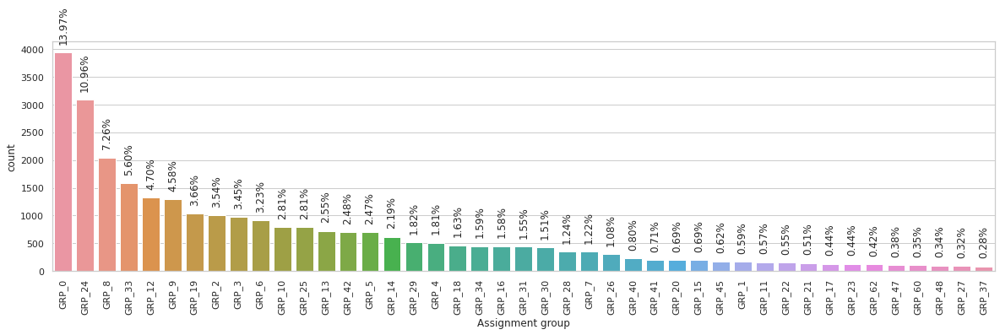

In [105]:
# Plot to visualize the percentage data distribution across different groups
sns.set(style="whitegrid")
plt.figure(figsize=(20,5))
ax = sns.countplot(x="Assignment group", data=clean_data, order=clean_data["Assignment group"].value_counts().index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
for p in ax.patches:
  ax.annotate(str(format(p.get_height()/len(clean_data.index)*100, '.2f')+"%"), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'bottom', rotation=90, xytext = (0, 10), textcoords = 'offset points')

In [106]:
top_20 = clean_data['Assignment group'].value_counts().nlargest(20).reset_index()

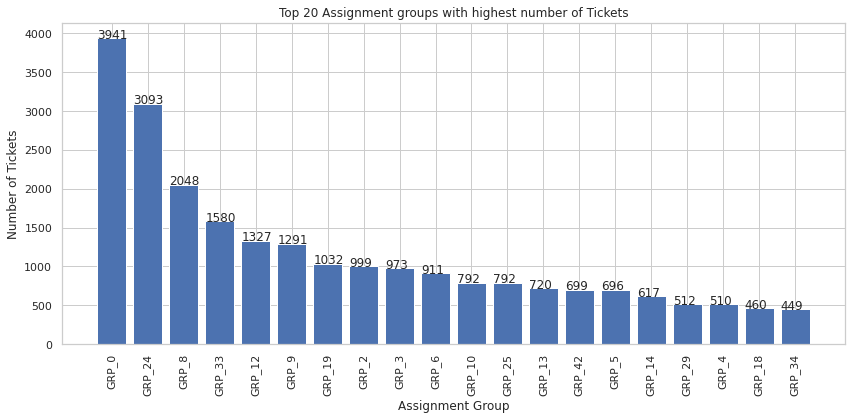

In [107]:
plt.figure(figsize=(12,6))
bars = plt.bar(top_20['index'],top_20['Assignment group'])
plt.title('Top 20 Assignment groups with highest number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

In [108]:
bottom_20 = clean_data['Assignment group'].value_counts().nsmallest(20).reset_index()

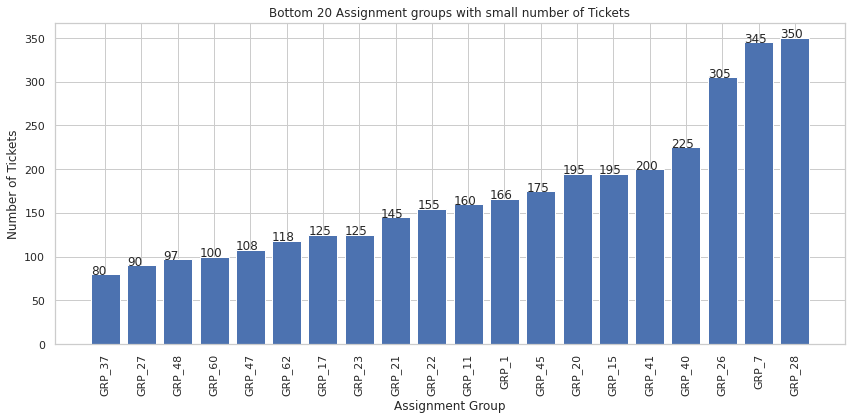

In [109]:
plt.figure(figsize=(12,6))
bars = plt.bar(bottom_20['index'],bottom_20['Assignment group'])
plt.title('Bottom 20 Assignment groups with small number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

#### The distribution of Callers
Plots how the callers are associated with tickets and what are the assignment groups they most frequently raise tickets for.

In [110]:
# Find out top 10 callers in terms of frequency of raising tickets in the entire dataset
print('\033[1mTotal caller count:\033[0m', clean_data['Caller'].nunique())
df = pd.DataFrame(clean_data.groupby(['Caller']).size().nlargest(10), columns=['Count']).reset_index()
df.iplot(kind='pie',
         labels='Caller', 
         values='Count', 
         title='Top 10 caller- Pie Chart (Fig-7)',
         colorscale='-spectral',
         pull=[0,0,0,0,0.05,0.1,0.15,0.2,0.25,0.3])

Total caller count: 2836


In [111]:
# Top 5 callers in each assignment group
top_n = 5
s = clean_data['Caller'].groupby(clean_data['Assignment group']).value_counts()
caller_grp = pd.DataFrame(s.groupby(level=0).nlargest(top_n).reset_index(level=0, drop=True))
caller_grp.head(15)

Caller
Assignment group Caller                   
GRP_0            fumkcsji sarmtlhy     132
                 rbozivdq gmlhrtvp      87
                 olckhmvx pcqobjnd      54
                 efbwiadp dicafxhv      45
                 mfeyouli ndobtzpw      13
GRP_1            bpctwhsn kzqsbmtp      30
                 jyoqwxhz clhxsoqy      30
                 jloygrwh acvztedi      20
                 spxqmiry zpwgoqju      15
                 kbnfxpsy gehxzayq      10
GRP_10           bpctwhsn kzqsbmtp     330
                 ihfkwzjd erbxoyqk      30
                 byclpwmv esafrtbh      25
                 dizquolf hlykecxa      25
                 pxvzohlu hwyijpgd      25

#### The distribution of description lengths
Plots the variation of length and word count of new description attribute

In [112]:
clean_data.insert(1, 'desc_len', clean_data['Final_Text'].astype(str).apply(len))
clean_data.insert(5, 'desc_word_count', clean_data['Final_Text'].apply(lambda x: len(str(x).split())))
clean_data.head()

,Caller,desc_len,Assignment group,language,Final_Text,desc_word_count
1,tqrylspg ijzghqwy,57,GRP_12,de,message mistake re - connection Hostname no ac...,9
1,tqrylspg ijzghqwy,57,GRP_12,de,message mistake re - connection Hostname no ac...,9
1,tqrylspg ijzghqwy,57,GRP_12,de,message mistake re - connection Hostname no ac...,9
1,tqrylspg ijzghqwy,57,GRP_12,de,message mistake re - connection Hostname no ac...,9
8,uhiekyjz mflihxpq,80,GRP_12,de,-PRON- access internal difficult drive pc acce...,12


In [113]:
# Description text length
clean_data['desc_len'].iplot(
    kind='bar',
    xTitle='text length',
    yTitle='count',
    colorscale='-ylgn',
    title='Description Text Length Distribution (Fig-11)')

# Description word count
clean_data['desc_word_count'].iplot(
    kind='bar',
    xTitle='word count',
    linecolor='black',
    yTitle='count',
    colorscale='-bupu',
    title='Description Word Count Distribution (Fig-12)')

### N-Grams
N-gram is a contiguous sequence of N items from a given sample of text or speech, in the fields of computational linguistics and probability. The items can be phonemes, syllables, letters, words or base pairs according to the application. N-grams are used to describe the number of words used as observation points, e.g., unigram means singly-worded, bigram means 2-worded phrase, and trigram means 3-worded phrase. 

We'll be using scikit-learn’s CountVectorizer function to derive n-grams and compare them before and after removing stop words. Stop words are a set of commonly used words in any language. We'll be using english corpus stopwords and extend it to include some business specific common words considered to be stop words in our case.

In [114]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from sklearn.feature_extraction.text import CountVectorizer

# Extend the English Stop Wordss
STOP_WORDS = STOPWORDS.union({'yes','na','hi',
                              'receive','hello',
                              'regards','thanks',
                              'from','greeting',
                              'forward','reply',
                              'will','please',
                              'see','help','able'})

# Generic function to derive top N n-grams from the corpus
def get_top_n_ngrams(corpus, top_n=None, ngram_range=(1,1), stopwords=None):
    vec = CountVectorizer(ngram_range=ngram_range, 
                          stop_words=stopwords).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:top_n]

### Top Unigrams

In [115]:
# Top 50 Unigrams before removing stop words
top_n = 50
ngram_range = (1,1)
uni_grams = get_top_n_ngrams(clean_data.Final_Text, top_n, ngram_range)

df = pd.DataFrame(uni_grams, columns = ['Final_Text' , 'count'])
df.groupby('Final_Text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', 
    yTitle='Count', 
    linecolor='black', 
    colorscale='piyg',
    title=f'Top {top_n} Unigrams in Final_Text')

# Top 50 Unigrams after removing stop words
uni_grams_sw = get_top_n_ngrams(clean_data.Final_Text, top_n, ngram_range, stopwords=STOP_WORDS)

df = pd.DataFrame(uni_grams_sw, columns = ['Final_Text' , 'count'])
df.groupby('Final_Text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', 
    yTitle='Count', 
    linecolor='black',
    colorscale='-piyg',
    title=f'Top {top_n} Unigrams in Final_Text without stop words')

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['aren', 'couldn', 'didn', 'doesn', 'don', 'hadn', 'hasn', 'haven', 'isn', 'let', 'll', 'mustn', 're', 'shan', 'shouldn', 've', 'wasn', 'weren', 'won', 'wouldn'] not in stop_words.



### Top Bigrams

In [116]:
# Top 50 Bigrams before removing stop words
top_n = 50
ngram_range = (2,2)
bi_grams = get_top_n_ngrams(clean_data.Final_Text, top_n, ngram_range)

df = pd.DataFrame(bi_grams, columns = ['Final_Text' , 'count'])
df.groupby('Final_Text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', 
    yTitle='Count', 
    linecolor='black', 
    colorscale='piyg',
    title=f'Top {top_n} Bigrams in Final_Text')

# Top 50 Bigrams after removing stop words
bi_grams_sw = get_top_n_ngrams(clean_data.Final_Text, top_n, ngram_range, stopwords=STOP_WORDS)

df = pd.DataFrame(bi_grams_sw, columns = ['Final_Text' , 'count'])
df.groupby('Final_Text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', 
    yTitle='Count', 
    linecolor='black',
    colorscale='-piyg',
    title=f'Top {top_n} Bigrams in Final_Text without stop words')

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['aren', 'couldn', 'didn', 'doesn', 'don', 'hadn', 'hasn', 'haven', 'isn', 'let', 'll', 'mustn', 're', 'shan', 'shouldn', 've', 'wasn', 'weren', 'won', 'wouldn'] not in stop_words.



### Top Trigrams

In [117]:
# Top 50 Trigrams before removing stop words
top_n = 50
ngram_range = (3,3)
tri_grams = get_top_n_ngrams(clean_data.Final_Text, top_n, ngram_range)

df = pd.DataFrame(tri_grams, columns = ['Final_Text' , 'count'])
df.groupby('Final_Text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', 
    yTitle='Count', 
    linecolor='black', 
    colorscale='piyg',
    title=f'Top {top_n} Trigrams in Final_Text')

# Top 50 Trigrams after removing stop words
tri_grams_sw = get_top_n_ngrams(clean_data.Final_Text, top_n, ngram_range, stopwords=STOP_WORDS)

df = pd.DataFrame(tri_grams_sw, columns = ['Final_Text' , 'count'])
df.groupby('Final_Text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', 
    yTitle='Count', 
    linecolor='black',
    colorscale='-piyg',
    title=f'Top {top_n} Trigrams in Final_Text without stop words')

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['aren', 'couldn', 'didn', 'doesn', 'don', 'hadn', 'hasn', 'haven', 'isn', 'let', 'll', 'mustn', 're', 'shan', 'shouldn', 've', 'wasn', 'weren', 'won', 'wouldn'] not in stop_words.



### Word Cloud
Let us attempt to visualize this as a word cloud for top three groups that has got maximum records. A word cloud enables us to visualize the data as cluster of words and each words displayed in different font size based on the number of occurences of that word . Basically; the bolder and bigger the word show up in the visualization, it implies its more often it’s mentioned within a given text compared to other words in the cloud and therefore would be more important for us.

Let's write a generic method to generate Word Clouds for both Short and Long Description columns.

In [118]:
# replace any single word character with a word boundary
#clean_data.Final_Text.str.replace(r'\b\w\b','').str.replace(r'\s+', ' ')

In [119]:
def generate_word_cloud(corpus):
        # Instantiate the wordcloud object
    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords=STOP_WORDS,
                    # mask=mask,
                    min_font_size = 10).generate(corpus)

    # plot the WordCloud image                        
    plt.figure(figsize = (12, 12), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 

    plt.show()

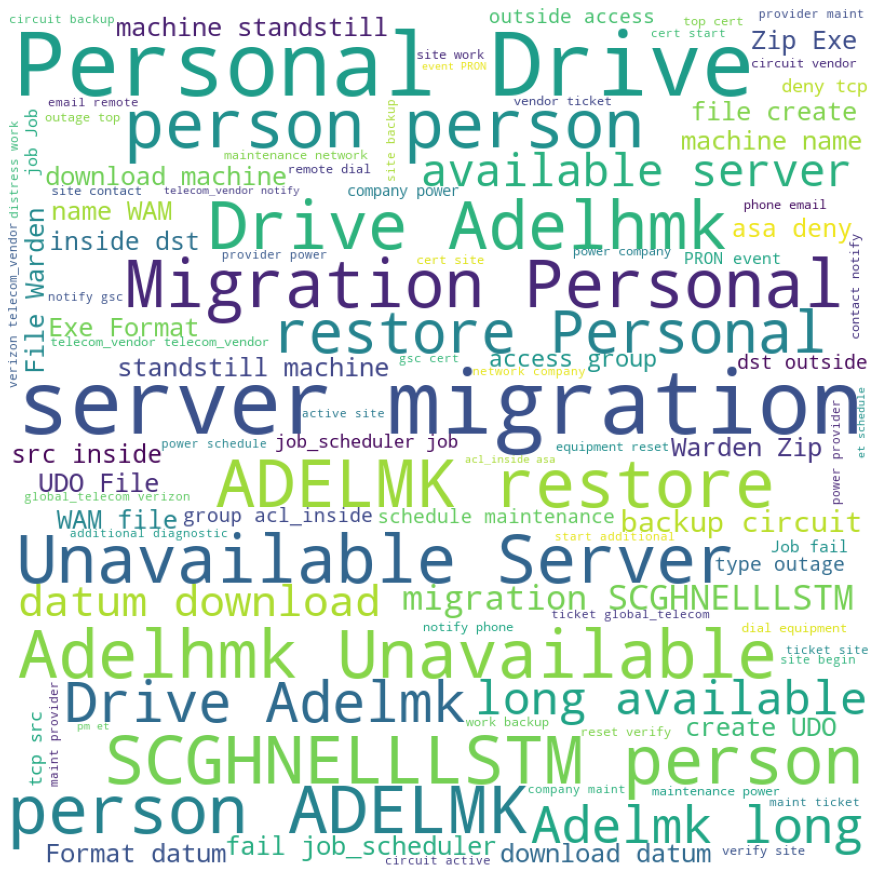

In [120]:
# Word Cloud for all tickets assigned to GRP_0
generate_word_cloud(' '.join(clean_data[clean_data['Assignment group'] == 'GRP_0'].Final_Text.str.strip()))

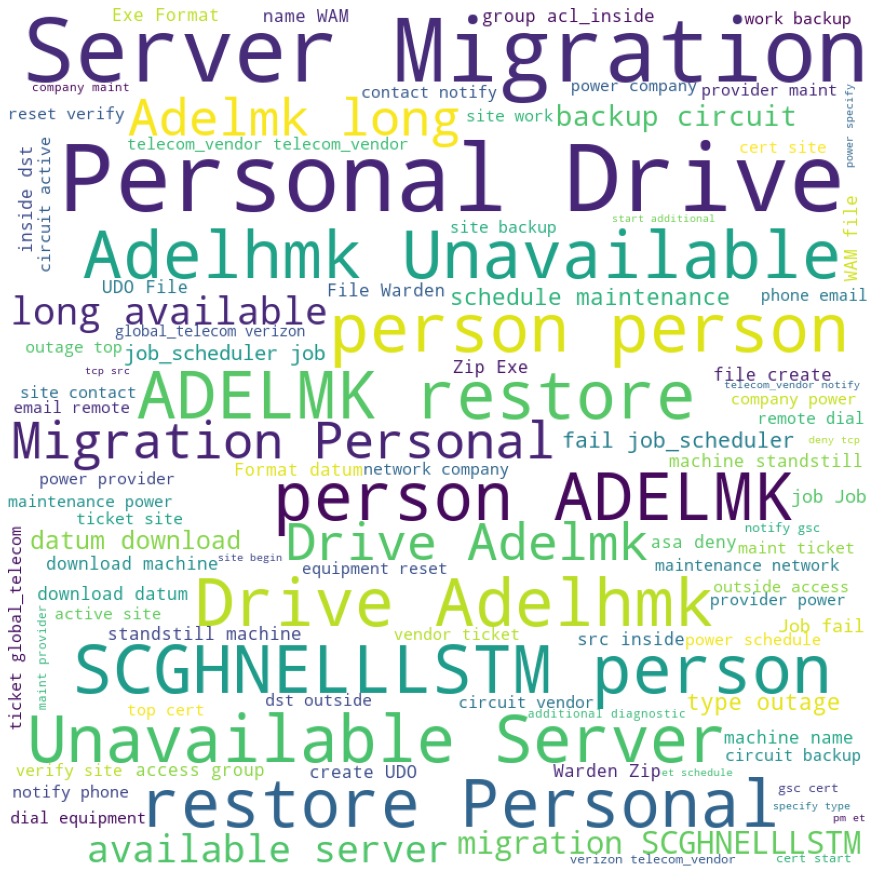

In [121]:
# Word Cloud for all tickets assigned to GRP_8
generate_word_cloud(' '.join(clean_data[clean_data['Assignment group'] == 'GRP_8'].Final_Text.str.strip()))

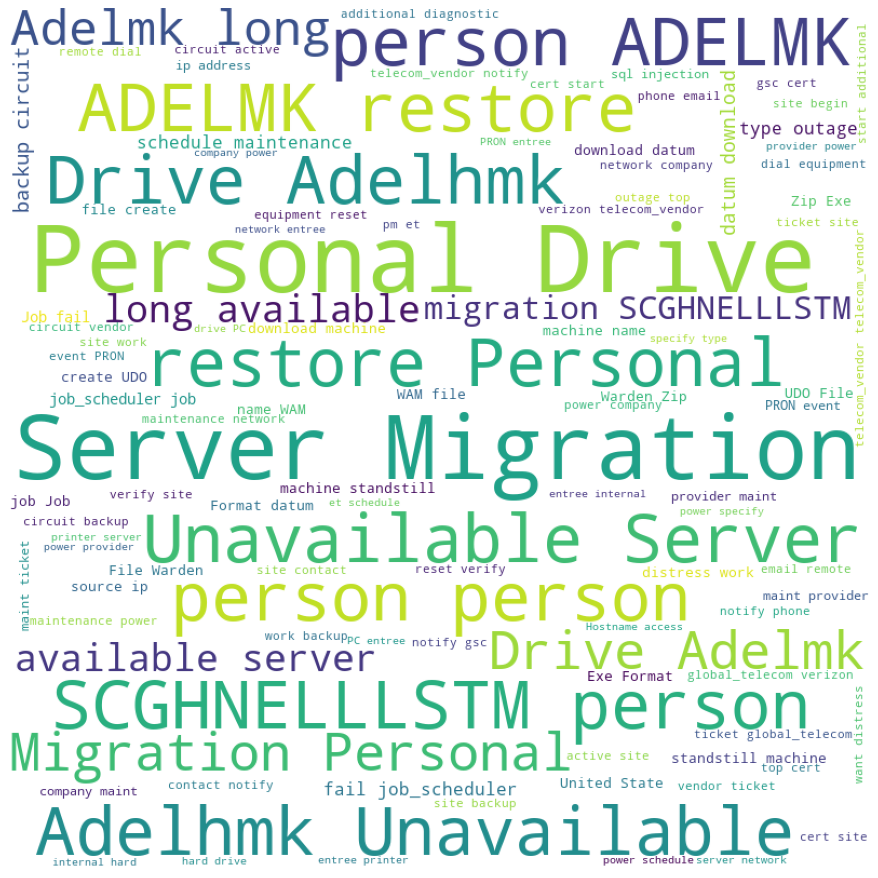

In [122]:
# Word Cloud for all tickets assigned to GRP_25
generate_word_cloud(' '.join(clean_data[clean_data['Assignment group'] == 'GRP_25'].Final_Text.str.strip()))

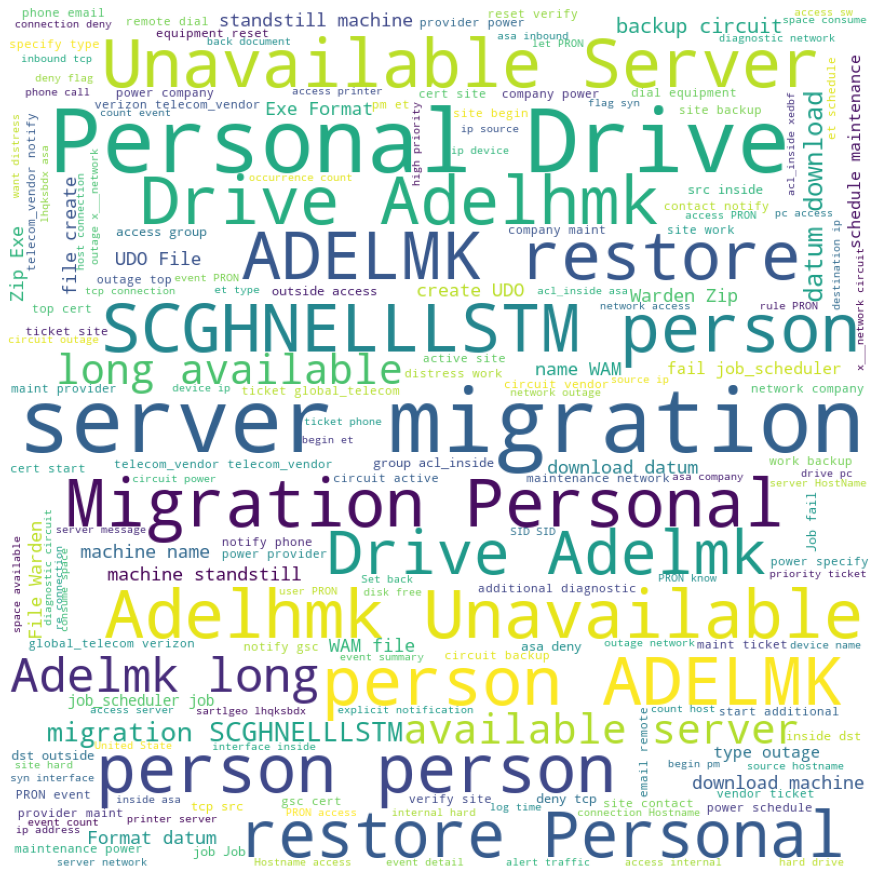

In [123]:
# Generate wordcloud for Final_Text field
generate_word_cloud(' '.join(clean_data.Final_Text.str.strip()))

## Prepping Dataframe for Model Building

In [124]:
'''# Create a target categorical column
clean_data['Assignment group OneHotEncoded'] = clean_data['Assignment group'].astype('category').cat.codes
clean_data.info()'''

"# Create a target categorical column\nclean_data['Assignment group OneHotEncoded'] = clean_data['Assignment group'].astype('category').cat.codes\nclean_data.info()"

In [125]:
'''# Import OneHot encoder 
from sklearn.preprocessing import LabelBinarizer
from sklearn import preprocessing 
clean_data['Assignment group OneHotEncoded'] = np.nan
# OneHot_encoder object knows how to understand word labels. 
#onehot_encoder = preprocessing.OneHotEncoder() #categories=62
onehot_encoder = LabelBinarizer()
onehot_encoder.fit(clean_data['Assignment group'])
# Encode labels in column
#transformed = onehot_encoder.fit_transform(clean_data['Assignment group'])
#temp_df = pd.DataFrame(transformed, columns=onehot_encoder.get_feature_names())
transformed = onehot_encoder.transform(clean_data['Assignment group'])
temp_df = pd.DataFrame(transformed)
clean_data = pd.concat([clean_data, temp_df], axis=1)
#clean_data
#clean_data['Assignment group OneHotEncoded'].unique()
clean_data'''

"# Import OneHot encoder \nfrom sklearn.preprocessing import LabelBinarizer\nfrom sklearn import preprocessing \nclean_data['Assignment group OneHotEncoded'] = np.nan\n# OneHot_encoder object knows how to understand word labels. \n#onehot_encoder = preprocessing.OneHotEncoder() #categories=62\nonehot_encoder = LabelBinarizer()\nonehot_encoder.fit(clean_data['Assignment group'])\n# Encode labels in column\n#transformed = onehot_encoder.fit_transform(clean_data['Assignment group'])\n#temp_df = pd.DataFrame(transformed, columns=onehot_encoder.get_feature_names())\ntransformed = onehot_encoder.transform(clean_data['Assignment group'])\ntemp_df = pd.DataFrame(transformed)\nclean_data = pd.concat([clean_data, temp_df], axis=1)\n#clean_data\n#clean_data['Assignment group OneHotEncoded'].unique()\nclean_data"

In [126]:
# Import label encoder 
from sklearn import preprocessing 
  
# label_encoder object knows how to understand word labels. 
label_encoder = preprocessing.LabelEncoder() 
  
# Encode labels in column 'species'. 
clean_data['Assignment group LabelEncoded']= label_encoder.fit_transform(clean_data['Assignment group']) 
  
clean_data['Assignment group LabelEncoded'].unique()

array([ 4, 12, 23,  5, 41, 11, 17, 25, 18, 26, 24, 32, 21,  1,  8, 27, 13,
        6,  2, 22, 29, 42, 36, 19, 37, 40, 10,  3,  7,  9, 15, 30, 31, 33,
       35, 34, 14, 16, 20, 28, 38, 39,  0])

In [127]:
label_encoded_dict = dict(zip(clean_data['Assignment group'].unique(), clean_data['Assignment group LabelEncoded'].unique()))
len(label_encoded_dict)

43

## Feature Extraction : Bag of Words using CountVectorizer

In [128]:
from sklearn.feature_extraction.text import CountVectorizer

CV = CountVectorizer(max_features=2000)

X_BoW = CV.fit_transform(clean_data['Final_Text']).toarray()
y = clean_data['Assignment group LabelEncoded']

print("Shape of Input Feature :",np.shape(X_BoW))
print("Shape of Target Feature :",np.shape(y))

Shape of Input Feature : (28208, 2000)
Shape of Target Feature : (28208,)


In [129]:
# Splitting Train Test 
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_BoW, y, test_size=0.3, random_state = 0, stratify=y)
print('\033[1mShape of the training set:\033[0m', X_train.shape, X_test.shape)
print('\033[1mShape of the test set:\033[0m', y_train.shape, y_test.shape)

Shape of the training set: (19745, 2000) (8463, 2000)
Shape of the test set: (19745,) (8463,)


In [130]:

def run_classification(estimator, X_train, X_test, y_train, y_test, arch_name=None, pipelineRequired=True, isDeepModel=False):
    # train the model
    clf = estimator

    if pipelineRequired :
        clf = Pipeline([('tfidf', TfidfTransformer()),
                     ('clf', estimator),
                     ])
      
    if isDeepModel :
        clf.fit(X_train, y_train, validation_data=(X_test, y_test),epochs=20, batch_size=128,verbose=1,callbacks=call_backs(arch_name))
        # predict from the clasiffier
        y_pred = clf.predict(X_test)
        y_pred = np.argmax(y_pred, axis=1)
        y_train_pred = clf.predict(X_train)
        y_train_pred = np.argmax(y_train_pred, axis=1)
    else :
        clf.fit(X_train, y_train)
        # predict from the clasiffier
        y_pred = clf.predict(X_test)
        y_train_pred = clf.predict(X_train)
    
    print('Estimator:', clf)
    print('='*80)
    print('Training accuracy: %.2f%%' % (accuracy_score(y_train,y_train_pred) * 100))
    print('Testing accuracy: %.2f%%' % (accuracy_score(y_test, y_pred) * 100))
    print('='*80)
    print('Confusion matrix:\n %s' % (confusion_matrix(y_test, y_pred)))
    print('='*80)
    print('Classification report:\n %s' % (classification_report(y_test, y_pred)))
    

## Logistic Regression

In [131]:
run_classification(LogisticRegression(), X_train, X_test, y_train, y_test)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Estimator: Pipeline(memory=None,
         steps=[('tfidf',
                 TfidfTransformer(norm='l2', smooth_idf=True,
                                  sublinear_tf=False, use_idf=True)),
                ('clf',
                 LogisticRegression(C=1.0, class_weight=None, dual=False,
                                    fit_intercept=True, intercept_scaling=1,
                                    l1_ratio=None, max_iter=100,
                                    multi_class='auto', n_jobs=None,
                                    penalty='l2', random_state=None,
                                    solver='lbfgs', tol=0.0001, verbose=0,
                                    warm_start=False))],
         verbose=False)
Training accuracy: 27.75%
Testing accuracy: 22.89%
Confusion matrix:
 [[480   0  10 ...   2  56  18]
 [ 12   0   3 ...   0  15   0]
 [ 68   0  61 ...   0  13   3]
 ...
 [ 47   0   1 ...   2   0   5]
 [169   0  10 ...   0 131   7]
 [121   0   2 ...   0  24  58]]
Classificatio

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



## Naive Bayes Classifier

In [132]:
run_classification(MultinomialNB(), X_train, X_test, y_train, y_test)

Estimator: Pipeline(memory=None,
         steps=[('tfidf',
                 TfidfTransformer(norm='l2', smooth_idf=True,
                                  sublinear_tf=False, use_idf=True)),
                ('clf',
                 MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True))],
         verbose=False)
Training accuracy: 23.42%
Testing accuracy: 20.00%
Confusion matrix:
 [[521   0   7 ...   2  97  18]
 [ 24   0   3 ...   0   7   0]
 [ 81   0  45 ...   0  24   4]
 ...
 [ 38   0   0 ...   0   9   7]
 [176   0   7 ...   0 142   8]
 [131   0   4 ...   0  48  46]]
Classification report:
               precision    recall  f1-score   support

           0       0.19      0.44      0.27      1182
           1       0.00      0.00      0.00        50
           2       0.37      0.19      0.25       238
           3       0.00      0.00      0.00        48
           4       0.30      0.06      0.10       398
           5       0.20      0.09      0.13       216
           6     

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



## K-nearest Neighbor

In [133]:
run_classification(KNeighborsClassifier(), X_train, X_test, y_train, y_test)

Estimator: Pipeline(memory=None,
         steps=[('tfidf',
                 TfidfTransformer(norm='l2', smooth_idf=True,
                                  sublinear_tf=False, use_idf=True)),
                ('clf',
                 KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                      metric='minkowski', metric_params=None,
                                      n_jobs=None, n_neighbors=5, p=2,
                                      weights='uniform'))],
         verbose=False)
Training accuracy: 34.61%
Testing accuracy: 27.95%
Confusion matrix:
 [[476  15  26 ...   8  39  31]
 [ 18  26   0 ...   0   1   0]
 [ 54   1 107 ...   3   0   3]
 ...
 [ 34   0   4 ...  23   3   0]
 [249  10  10 ...   5 115   9]
 [167   2   7 ...   1   5  89]]
Classification report:
               precision    recall  f1-score   support

           0       0.14      0.40      0.21      1182
           1       0.19      0.52      0.28        50
           2       0.48      0.45

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



## Support Vector Machine (SVM)

In [134]:
run_classification(LinearSVC(), X_train, X_test, y_train, y_test)

Estimator: Pipeline(memory=None,
         steps=[('tfidf',
                 TfidfTransformer(norm='l2', smooth_idf=True,
                                  sublinear_tf=False, use_idf=True)),
                ('clf',
                 LinearSVC(C=1.0, class_weight=None, dual=True,
                           fit_intercept=True, intercept_scaling=1,
                           loss='squared_hinge', max_iter=1000,
                           multi_class='ovr', penalty='l2', random_state=None,
                           tol=0.0001, verbose=0))],
         verbose=False)
Training accuracy: 34.95%
Testing accuracy: 28.12%
Confusion matrix:
 [[247   1  22 ...  11  62  32]
 [  5   7   0 ...   0  15   0]
 [ 26   0  80 ...   3  10   5]
 ...
 [ 16   0   2 ...  23   6   9]
 [ 83   3   9 ...   0 138  21]
 [ 41   0   1 ...   0  22 105]]
Classification report:
               precision    recall  f1-score   support

           0       0.27      0.21      0.24      1182
           1       0.54      0.14     

## Decision Tree

In [135]:
run_classification(DecisionTreeClassifier(), X_train, X_test, y_train, y_test)

Estimator: Pipeline(memory=None,
         steps=[('tfidf',
                 TfidfTransformer(norm='l2', smooth_idf=True,
                                  sublinear_tf=False, use_idf=True)),
                ('clf',
                 DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                        criterion='gini', max_depth=None,
                                        max_features=None, max_leaf_nodes=None,
                                        min_impurity_decrease=0.0,
                                        min_impurity_split=None,
                                        min_samples_leaf=1, min_samples_split=2,
                                        min_weight_fraction_leaf=0.0,
                                        presort='deprecated', random_state=None,
                                        splitter='best'))],
         verbose=False)
Training accuracy: 39.85%
Testing accuracy: 32.66%
Confusion matrix:
 [[256   4  21 ...  12  56  30]
 [  4  1

## Random Forest

In [136]:
run_classification(RandomForestClassifier(n_estimators=100), X_train, X_test, y_train, y_test)

Estimator: Pipeline(memory=None,
         steps=[('tfidf',
                 TfidfTransformer(norm='l2', smooth_idf=True,
                                  sublinear_tf=False, use_idf=True)),
                ('clf',
                 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                        class_weight=None, criterion='gini',
                                        max_depth=None, max_features='auto',
                                        max_leaf_nodes=None, max_samples=None,
                                        min_impurity_decrease=0.0,
                                        min_impurity_split=None,
                                        min_samples_leaf=1, min_samples_split=2,
                                        min_weight_fraction_leaf=0.0,
                                        n_estimators=100, n_jobs=None,
                                        oob_score=False, random_state=None,
                                        verbose=0, 

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
run_classification(GradientBoostingClassifier(n_estimators=100), X_train, X_test, y_train, y_test)

## Deep Neural Networks

In [ ]:
# Load the augmented data from pickle file 
with open('/content/Interim_data.pkl','rb') as f:
    clean_data_DL = pickle.load(f)

In [ ]:
clean_data_DL.isnull().sum()

In [ ]:
clean_data_DL['Final_Text'] = clean_data_DL['Final_Text'].replace(np.nan, '', regex=True)

In [ ]:
clean_data_DL.info()

In [ ]:
# Import OneHot encoder 
from sklearn import preprocessing 
  
# onehot_encoder object knows how to understand word labels. 
onehot_encoder = preprocessing.OneHotEncoder() 
  
# Encode labels in column 'species'. 
clean_data_DL['Assignment group OneHotEncoded']= onehot_encoder.fit_transform(clean_data_DL['Assignment group']) 
  
clean_data_DL['Assignment group OneHotEncoded'].unique()

In [ ]:
onehot_encoded_dict = dict(zip(clean_data_DL['Assignment group'].unique(), clean_data_DL['Assignment group LabelEncoded'].unique()))
len(onehot_encoded_dict)

In [ ]:
# Splitting Train Test 
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(clean_data_DL['Final_Text'], clean_data_DL['Assignment group OneHotEncoded'], test_size=0.3, random_state = 0, stratify=clean_data_DL['Assignment group OneHotEncoded'])
print('\033[1mShape of the training set:\033[0m', X_train.shape, X_test.shape)
print('\033[1mShape of the test set:\033[0m', y_train.shape, y_test.shape)

### Create checkpoints function

In [ ]:
#Path where you want to save the weights, model and checkpoints
model_path = "Weights/"
%mkdir Weights

# Define model callbacks
def call_backs(name):
    early_stopping = EarlyStopping(monitor='val_loss', min_delta=0.005, patience=100)
    model_checkpoint =  ModelCheckpoint(model_path + name + '_epoch{epoch:02d}_loss{val_loss:.4f}.h5',
                                                               monitor='val_loss',
                                                               verbose=1,
                                                               save_best_only=True,
                                                               save_weights_only=False,
                                                               mode='min',
                                                               period=1)
    return [model_checkpoint, early_stopping]

In [ ]:
# Function to build Neural Network
def Build_Model_DNN_Text(shape, nClasses, dropout=0.3):
    """
    buildModel_DNN_Tex(shape, nClasses,dropout)
    Build Deep neural networks Model for text classification
    Shape is input feature space
    nClasses is number of classes
    """
    model = Sequential()
    node = 512 # number of nodes
    nLayers = 4 # number of  hidden layer
    model.add(Dense(node,input_dim=shape,activation='relu'))
    model.add(Dropout(dropout))
    for i in range(0,nLayers):
        model.add(Dense(node,input_dim=node,activation='relu'))
        model.add(Dropout(dropout))
        model.add(BatchNormalization())
    model.add(Dense(nClasses, activation='softmax'))
    model.compile(loss='sparse_categorical_crossentropy',
                  optimizer='adam',
                  metrics=['accuracy'])
    print(model.summary())
    return model

In [ ]:
Tfidf_vect = TfidfVectorizer(max_features=2000)
Tfidf_vect.fit(clean_data_DL.Final_Text.astype(str))
X_train_tfidf = Tfidf_vect.transform(X_train)
X_test_tfidf = Tfidf_vect.transform(X_test)

# Instantiate the network
model_DNN = Build_Model_DNN_Text(X_train_tfidf.shape[1], 62)

In [ ]:
run_classification(model_DNN, X_train_tfidf, X_test_tfidf, y_train, y_test,pipelineRequired = False,isDeepModel=True, arch_name='DNN')

'''model_DNN.fit(X_train_tfidf, y_train,
                              validation_data=(X_test_tfidf, y_test),
                              callbacks=call_backs("NN"),
                              epochs=10,
                              batch_size=128,
                              verbose=2)
predicted = model_DNN.predict(X_test_tfidf)'''

### Extract Glove Embeddings

In [ ]:
#download the glove embedding zip file from http://nlp.stanford.edu/data/wordvecs/glove.6B.zip
from zipfile import ZipFile
# Check if it is already extracted else Open the zipped file as readonly
if not os.path.isfile('glove.6B/glove.6B.200d.txt'):
    #glove_embeddings = 'glove.6B.zip'
    glove_embeddings = '/content/drive/MyDrive/Capstone/glove.6B.zip'
    with ZipFile(glove_embeddings, 'r') as archive:
        archive.extractall('glove.6B')

# List the files under extracted folder
os.listdir('glove.6B')

## Convolutional Neural Networks (CNN)

In [ ]:
#gloveFileName = 'glove.6B/glove.6B.200d.txt'
gloveFileName = '/content/glove.6B/glove.6B.200d.txt'
MAX_SEQUENCE_LENGTH = 500
EMBEDDING_DIM=200
MAX_NB_WORDS=75000

# Function to generate Embedding
def loadData_Tokenizer(X_train, X_test,filename):
    np.random.seed(7)
    text = np.concatenate((X_train, X_test), axis=0)
    text = np.array(text)
    tokenizer = Tokenizer(num_words=MAX_NB_WORDS)
    tokenizer.fit_on_texts(text)
    sequences = tokenizer.texts_to_sequences(text)
    word_index = tokenizer.word_index
    text = pad_sequences(sequences, maxlen=MAX_SEQUENCE_LENGTH)
    print('Found %s unique tokens.' % len(word_index))
    indices = np.arange(text.shape[0])
    # np.random.shuffle(indices)
    text = text[indices]
    print(text.shape)
    X_train = text[0:len(X_train), ]
    X_test = text[len(X_train):, ]
    embeddings_index = {}
    f = open(filename, encoding="utf8")
    for line in f:
        values = line.split()
        word = values[0]
        try:
            coefs = np.asarray(values[1:], dtype='float32')
        except:
            pass
        embeddings_index[word] = coefs
    f.close()
    print('Total %s word vectors.' % len(embeddings_index))
    return (X_train, X_test, word_index,embeddings_index)


embedding_matrix = []

def buildEmbed_matrices(word_index,embedding_dim):
    embedding_matrix = np.random.random((len(word_index) + 1, embedding_dim))
    for word, i in word_index.items():
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            # words not found in embedding index will be all-zeros.
            if len(embedding_matrix[i]) !=len(embedding_vector):
                print("could not broadcast input array from shape",str(len(embedding_matrix[i])), "into shape",str(len(embedding_vector)),
                      " Please make sure your"" EMBEDDING_DIM is equal to embedding_vector file ,GloVe,")
                exit(1)
            embedding_matrix[i] = embedding_vector
    return embedding_matrix

In [ ]:
# Generate Glove embedded datasets
X_train_Glove, X_test_Glove, word_index, embeddings_index = loadData_Tokenizer(X_train,X_test,gloveFileName)
embedding_matrix = buildEmbed_matrices(word_index,EMBEDDING_DIM)

In [ ]:
def Build_Model_CNN_Text(word_index, embeddings_matrix, nclasses,dropout=0.5):
    """
        def buildModel_CNN(word_index, embeddings_index, nclasses, MAX_SEQUENCE_LENGTH=500, EMBEDDING_DIM=50, dropout=0.5):
        word_index in word index ,
        embeddings_index is embeddings index, look at data_helper.py
        nClasses is number of classes,
        MAX_SEQUENCE_LENGTH is maximum lenght of text sequences,
        EMBEDDING_DIM is an int value for dimention of word embedding look at data_helper.py
    """
    model = Sequential()
    embedding_layer = Embedding(len(word_index) + 1,
                                EMBEDDING_DIM,
                                weights=[embeddings_matrix],
                                input_length=MAX_SEQUENCE_LENGTH,
                                trainable=True)
    # applying a more complex convolutional approach
    convs = []
    filter_sizes = []
    layer = 5
    print("Filter  ",layer)
    for fl in range(0,layer):
        filter_sizes.append((fl+2))
    node = 128
    sequence_input = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')
    embedded_sequences = embedding_layer(sequence_input)
    for fsz in filter_sizes:
        l_conv = Conv1D(node, kernel_size=fsz, activation='relu')(embedded_sequences)
        l_pool = MaxPooling1D(5)(l_conv)
        #l_pool = Dropout(0.25)(l_pool)
        convs.append(l_pool)
    l_merge = Concatenate(axis=1)(convs)
    l_cov1 = Conv1D(node, 5, activation='relu')(l_merge)
    l_cov1 = Dropout(dropout)(l_cov1)
    l_batch1 = BatchNormalization()(l_cov1)
    l_pool1 = MaxPooling1D(5)(l_batch1)
    l_cov2 = Conv1D(node, 5, activation='relu')(l_pool1)
    l_cov2 = Dropout(dropout)(l_cov2)
    l_batch2 = BatchNormalization()(l_cov2)
    l_pool2 = MaxPooling1D(30)(l_batch2)
    l_flat = Flatten()(l_pool2)
    l_dense = Dense(1024, activation='relu')(l_flat)
    l_dense = Dropout(dropout)(l_dense)
    l_dense = Dense(512, activation='relu')(l_dense)
    l_dense = Dropout(dropout)(l_dense)
    preds = Dense(nclasses, activation='softmax')(l_dense)
    model = Model(sequence_input, preds)
    model.compile(loss='sparse_categorical_crossentropy',
                  optimizer='adam',
                  metrics=['accuracy'])
    
    print(model.summary())
    return model

In [ ]:
# Train the network and run classification
model_CNN = Build_Model_CNN_Text(word_index,embedding_matrix, 62)
run_classification(model_CNN, X_train_Glove, X_test_Glove, y_train, y_test,pipelineRequired = False,isDeepModel=True, arch_name='CNN')

## Recurrent Neural Networks (RNN) --> Gated Recurrent Unit (GRU)

In [ ]:
def Build_Model_RNN_Text(word_index, embeddings_matrix, nclasses,dropout=0.5):
    """
    def buildModel_RNN(word_index, embeddings_matrix, nclasses,  MAX_SEQUENCE_LENGTH=500, EMBEDDING_DIM=100, dropout=0.5):
    word_index in word index ,
    embeddings_matrix is embeddings_matrix, look at data_helper.py
    nClasses is number of classes,
    MAX_SEQUENCE_LENGTH is maximum lenght of text sequences
    """
    model = Sequential()
    hidden_layer = 3
    gru_node = 32
    
    model.add(Embedding(len(word_index) + 1,
                                EMBEDDING_DIM,
                                weights=[embeddings_matrix],
                                input_length=MAX_SEQUENCE_LENGTH,
                                trainable=True))
    print(gru_node)
    for i in range(0,hidden_layer):
        model.add(GRU(gru_node,return_sequences=True, recurrent_dropout=0.2))
        model.add(Dropout(dropout))
        model.add(BatchNormalization())
    model.add(GRU(gru_node, recurrent_dropout=0.2))
    model.add(Dropout(dropout))
    model.add(BatchNormalization())
    model.add(Dense(256, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dense(nclasses, activation='softmax'))
    model.compile(loss='sparse_categorical_crossentropy',
                      optimizer='sgd',
                      metrics=['accuracy'])
    
    print(model.summary())
    return model

In [ ]:
# Train the network and run classification
model_RNN = Build_Model_RNN_Text(word_index,embedding_matrix, 62)
run_classification(model_RNN, X_train_Glove, X_test_Glove, y_train, y_test,pipelineRequired = False,isDeepModel=True, arch_name='RNN')

## RNN with LSTM networks

In [ ]:
EMBEDDING_DIM = 200
#gloveFileName = 'glove.6B/glove.6B.100d.txt'
gloveFileName = '/content/glove.6B/glove.6B.200d.txt'

from keras.models import Sequential
from keras.layers import Dense, LSTM, TimeDistributed, Activation
from keras.layers import Flatten, Permute, merge, Input
from keras.layers import Embedding
from keras.models import Model
from keras.layers import Input, Dense, multiply, concatenate, Dropout
from keras.layers import GRU, Bidirectional


def Build_Model_LTSM_Text(word_index, embeddings_matrix, nclasses):
    kernel_size = 2
    filters = 256
    pool_size = 2
    gru_node = 256
    
    model = Sequential()
    model.add(Embedding(len(word_index) + 1,
                                EMBEDDING_DIM,
                                weights=[embeddings_matrix],
                                input_length=MAX_SEQUENCE_LENGTH,
                                trainable=True))
    model.add(Dropout(0.25))
    model.add(Conv1D(filters, kernel_size, activation='relu'))
    model.add(MaxPooling1D(pool_size=pool_size))
    model.add(Conv1D(filters, kernel_size, activation='relu'))
    model.add(MaxPooling1D(pool_size=pool_size))
    model.add(Conv1D(filters, kernel_size, activation='relu'))
    model.add(MaxPooling1D(pool_size=pool_size))
    model.add(Conv1D(filters, kernel_size, activation='relu'))
    model.add(MaxPooling1D(pool_size=pool_size))
    model.add(Bidirectional(LSTM(gru_node, return_sequences=True, recurrent_dropout=0.2)))
    model.add(Bidirectional(LSTM(gru_node, return_sequences=True, recurrent_dropout=0.2)))
    model.add(Bidirectional(LSTM(gru_node, return_sequences=True, recurrent_dropout=0.2)))
    model.add(Bidirectional(LSTM(gru_node, recurrent_dropout=0.2)))
    model.add(Dense(1024,activation='relu'))
    model.add(Dense(nclasses))
    model.add(Activation('softmax'))
    model.compile(loss='sparse_categorical_crossentropy',
                  optimizer='adam',
                  metrics=['accuracy'])
    
    print(model.summary())
    return model

In [ ]:
X_train_Glove,X_test_Glove, word_index,embeddings_index = loadData_Tokenizer(X_train,X_test,gloveFileName)
embedding_matrix = buildEmbed_matrices(word_index,EMBEDDING_DIM)

model_LTSM = Build_Model_LTSM_Text(word_index,embedding_matrix, 62)
run_classification(model_LTSM, X_train_Glove, X_test_Glove, y_train, y_test,pipelineRequired = False,isDeepModel=True, arch_name='LSTM')